# Introduction

The objectives of this notebook are:

1. Go through the different datasets one by one to understand in detail what they contain.
2. For each dataset, answer questions I have that can help me understand the business meaning of the datasets.
3. Practice and improve my coding skills to be more efficient and faster in my data analyses.

# 1 - Importation

## 1.1 Main libraries

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt, rcParams, style
import seaborn as sns

import folium
from folium.plugins import MarkerCluster

## 1.2 Settings

In [2]:
# Viualisation options to put here
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 150)

## 1.3 Datasets load

In [3]:
train = pd.read_csv('/Users/kevinboulliat/Desktop/Data Science/predict-energy-behavior-of-prosumers/train.csv')
train.head(2)

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id
0,0,0,1,0.713,0,2021-09-01 00:00:00,0,0,0
1,0,0,1,96.590,1,2021-09-01 00:00:00,0,1,0


In [4]:
weather_forecast = pd.read_csv('/Users/kevinboulliat/Desktop/Data Science/predict-energy-behavior-of-prosumers/forecast_weather.csv')
weather_forecast.head(2)

,latitude,longitude,origin_datetime,hours_ahead,temperature,dewpoint,cloudcover_high,cloudcover_low,cloudcover_mid,cloudcover_total,10_metre_u_wind_component,10_metre_v_wind_component,data_block_id,forecast_datetime,direct_solar_radiation,surface_solar_radiation_downwards,snowfall,total_precipitation
0,57.6,21.7,2021-09-01 02:00:00,1,15.655786,11.553613,0.904816,0.019714,0.0,0.905899,-0.411328,-9.106137,1,2021-09-01 03:00:00,0.0,0.0,0.0,0.0
1,57.6,22.2,2021-09-01 02:00:00,1,13.003931,10.689844,0.886322,0.004456,0.0,0.886658,0.206347,-5.355405,1,2021-09-01 03:00:00,0.0,0.0,0.0,0.0


In [5]:
elec_price = pd.read_csv('/Users/kevinboulliat/Desktop/Data Science/predict-energy-behavior-of-prosumers/electricity_prices.csv')
elec_price.head(2)

,forecast_date,euros_per_mwh,origin_date,data_block_id
0,2021-09-01 00:00:00,92.51,2021-08-31 00:00:00,1
1,2021-09-01 01:00:00,88.90,2021-08-31 01:00:00,1


In [6]:
gas_price = pd.read_csv('/Users/kevinboulliat/Desktop/Data Science/predict-energy-behavior-of-prosumers/gas_prices.csv')
gas_price.head(2)

,forecast_date,lowest_price_per_mwh,highest_price_per_mwh,origin_date,data_block_id
0,2021-09-01,45.23,46.32,2021-08-31,1
1,2021-09-02,45.62,46.29,2021-09-01,2


In [7]:
client = pd.read_csv('/Users/kevinboulliat/Desktop/Data Science/predict-energy-behavior-of-prosumers/client.csv')
client.head(2)

,product_type,county,eic_count,installed_capacity,is_business,date,data_block_id
0,1,0,108,952.89,0,2021-09-01,2
1,2,0,17,166.40,0,2021-09-01,2


In [8]:
station = pd.read_csv('/Users/kevinboulliat/Desktop/Data Science/predict-energy-behavior-of-prosumers/weather_station_to_county_mapping.csv')
station.head(2)

,county_name,longitude,latitude,county
0,NaN,21.7,57.6,NaN
1,NaN,21.7,57.9,NaN


In [9]:
weather_hist = pd.read_csv('/Users/kevinboulliat/Desktop/Data Science/predict-energy-behavior-of-prosumers/historical_weather.csv')
weather_hist.head(2)

,datetime,temperature,dewpoint,rain,snowfall,surface_pressure,cloudcover_total,cloudcover_low,cloudcover_mid,cloudcover_high,windspeed_10m,winddirection_10m,shortwave_radiation,direct_solar_radiation,diffuse_radiation,latitude,longitude,data_block_id
0,2021-09-01 00:00:00,14.2,11.6,0.0,0.0,1015.9,31,31,0,11,7.083333,8,0.0,0.0,0.0,57.6,21.7,1.0
1,2021-09-01 00:00:00,13.9,11.5,0.0,0.0,1010.7,33,37,0,0,5.111111,359,0.0,0.0,0.0,57.6,22.2,1.0


In [11]:
def dataset_presentation(df):
    '''A very basic function to detail the shape of a given datasets amd also to notify if some columns contains missing values
    '''

    #Usefull variables
    shape = df.shape
    columns_to_clean = []

    #General comments
    print(' '*20)
    print(' '*20)
    print('General introduction')

    print(' '*20)
    print (f'Shape : {shape}')
    print(' '*20)

    #Details per column
    for column in df.columns :
        percentage_null = df[column].isnull().sum()/shape[0]
        c_type = df[column].dtype

        print('-'*20)
        print (f'{column} is the following type : {c_type}')
        print (f'{column} percentage missinge value : {percentage_null}%')
        print('-'*20)

        #Store columns with missing values to clean later
        if percentage_null > 0 :
            columns_to_clean.append(column)

    if len(columns_to_clean) == 0 :
        print('Lucky, no column to clean because of missing values ✅')

    else :
        print('You have to deal with some missing values ❌')
        print(f'columns to deal with are the following {columns_to_clean}')


# 2 - Electricity EDA

## 2.0 - Questions

I am going to study in detail in this section the dataset related to electricity price. In particular, i'll try to answer the following questions:
1. What's the weekly price trend? Are there any major changes between years?
2. What's the monthly price trend? Are there any major changes between years?
3. What's the daily price trend? Are there any major changes between years?
4. What is the overall price evolution, hours per hours?
5. How did the war in Ukraine affect the electricity market in Estonia ?
6. Are there any outliers?

## 2.1 - Setup

In [558]:
dataset_presentation(elec_price)

                    
                    
General introduction
                    
Shape : (15286, 4)
                    
--------------------
forecast_date is the following type : object
forecast_date percentage missinge value : 0.0%
--------------------
--------------------
euros_per_mwh is the following type : float64
euros_per_mwh percentage missinge value : 0.0%
--------------------
--------------------
origin_date is the following type : object
origin_date percentage missinge value : 0.0%
--------------------
--------------------
data_block_id is the following type : int64
data_block_id percentage missinge value : 0.0%
--------------------
Lucky, no column to clean because of missing values ✅


In [405]:
elec_price2 = elec_price.copy()

# Keep only the columns that will be usefull to answer my questions
elec_price2 = elec_price2[['forecast_date','euros_per_mwh']]
elec_price2.set_index('forecast_date');

In [560]:
elec_price2['forecast_date'].min() , elec_price2['forecast_date'].max()

# Create a calendar dataset with the appropriate frequency so that I can resample the data more easily afterward
calendar_hour = pd.date_range(start='2021-09-01 00:00:00',end='2023-05-30 23:00:00',freq='H')
calendar_df = pd.DataFrame(calendar_hour, columns=['datetime'])
calendar_elec = calendar_df.join(elec_price2)

calendar_elec.set_index('datetime', inplace=True)

## 2.2 - Electricity price evolution per week

In [561]:
# Resample the data with weekly frequency
weekly_avg = calendar_elec.resample('W').mean()

In [562]:
# Create new appropriate columns
weekly_avg['year']=weekly_avg.index.year
weekly_avg['week']=weekly_avg.index.week
weekly_avg['month']=weekly_avg.index.month

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_9828/3006680858.py:2: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  weekly_avg['week']=weekly_avg.index.week


In [563]:
# Create three datasets, one for each year, so we can distinguish the years when we plot the data
weekly_avg2021 = weekly_avg[weekly_avg['year']== 2021]
weekly_avg2022 = weekly_avg[weekly_avg['year']== 2022]
weekly_avg2023 = weekly_avg[weekly_avg['year']== 2023]

In [564]:
# Clean the data so the plot can be easier to read
weekly_avg2022.index.sort_values
weekly_avg2022['week'] = weekly_avg2022['week'] + 1
weekly_avg2022.loc['2022-01-02','week'] = 1

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_9828/3417314786.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weekly_avg2022['week'] = weekly_avg2022['week'] + 1


In [565]:
# Clean the data so the plot can be easier to read
weekly_avg2023.index.sort_values
weekly_avg2023['week'] = weekly_avg2023['week'] + 1
weekly_avg2023.loc['2023-01-01','week'] = 1

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_9828/1542528778.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weekly_avg2023['week'] = weekly_avg2023['week'] + 1


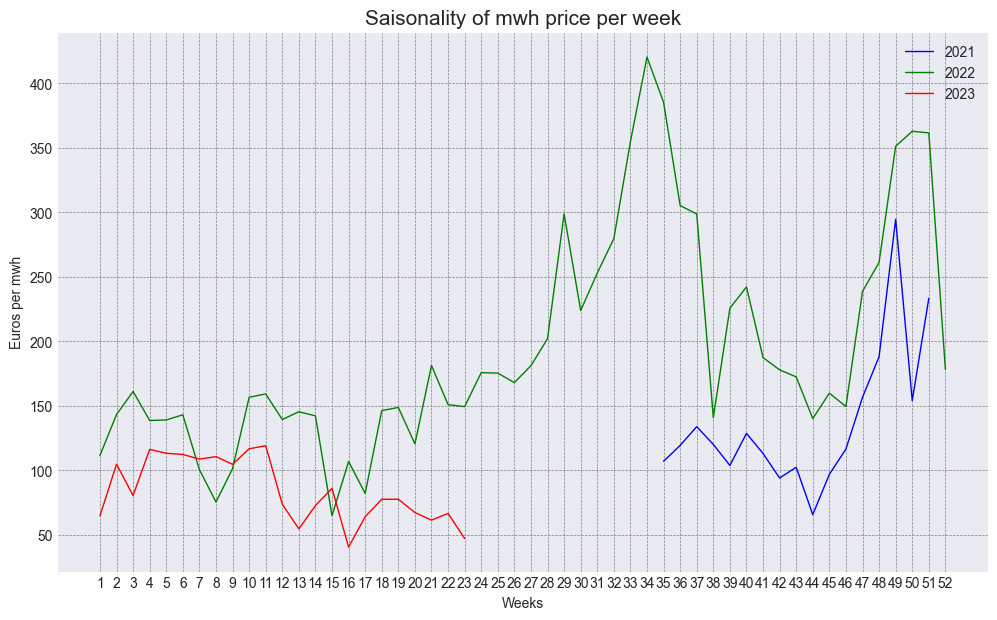

In [566]:
fig, ax = plt.subplots(figsize=(12,7))

ax.plot(weekly_avg2021['week'], weekly_avg2021['euros_per_mwh'], label='2021', color='b', linestyle='-', linewidth=1)
ax.plot(weekly_avg2022['week'], weekly_avg2022['euros_per_mwh'], label='2022', color='g', linestyle='-', linewidth=1)
ax.plot(weekly_avg2023['week'], weekly_avg2023['euros_per_mwh'], label='2023', color='r', linestyle='-', linewidth=1)

ax.set_title('Saisonality of mwh price per week', fontsize=15)
ax.set_xlabel('Weeks')
ax.set_ylabel('Euros per mwh')
ax.set_xticks(weekly_avg2022['week'])

ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax.legend()

## 2.3 - Electricity price per month

We will use the same process than before to plot monthly data.

In [567]:
month_avg = calendar_elec.resample('M').mean()

In [568]:
month_avg['year']=month_avg.index.year
month_avg['week']=month_avg.index.week
month_avg['month']=month_avg.index.month

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_9828/1079696548.py:2: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  month_avg['week']=month_avg.index.week


In [569]:
month_avg2021 = month_avg[month_avg['year']== 2021]
month_avg2022 = month_avg[month_avg['year']== 2022]
month_avg2023 = month_avg[month_avg['year']== 2023]

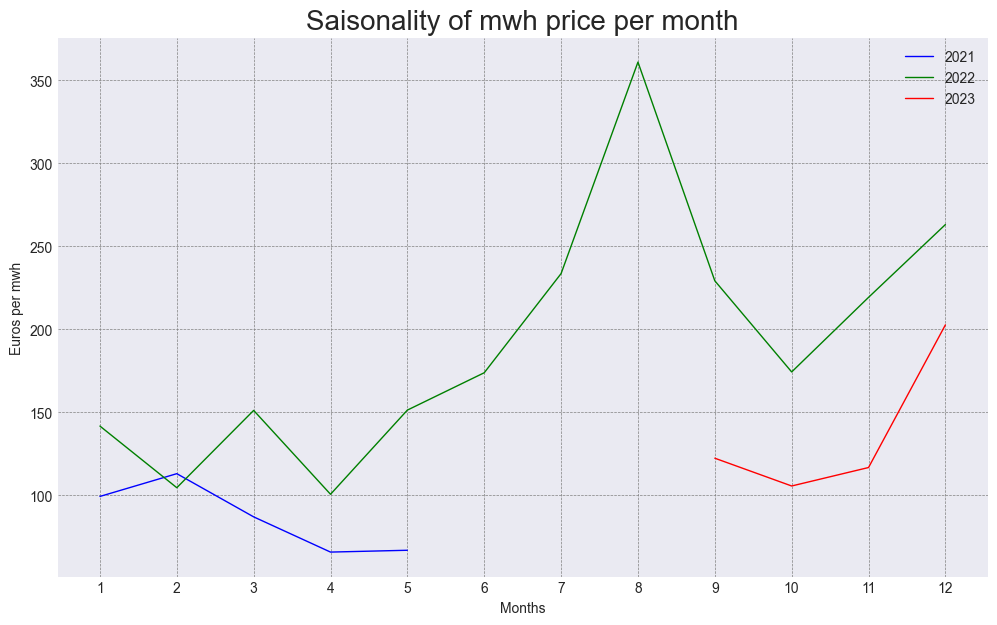

In [570]:
fig, ax = plt.subplots(figsize=(12,7))

ax.plot(month_avg2023['month'], month_avg2023['euros_per_mwh'], label='2021', color='b', linestyle='-', linewidth=1)
ax.plot(month_avg2022['month'], month_avg2022['euros_per_mwh'], label='2022', color='g', linestyle='-', linewidth=1)
ax.plot(month_avg2021['month'], month_avg2021['euros_per_mwh'], label='2023', color='r', linestyle='-', linewidth=1)

ax.set_title('Saisonality of mwh price per month', fontsize=20)
ax.set_xlabel('Months')
ax.set_ylabel('Euros per mwh')
ax.set_xticks(month_avg2022['month'])

ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax.legend()

## 2.4 - Electricity price per day

We will use the same process than before to plot daily data.

In [571]:
daily_avg = calendar_elec.resample('D').mean()
daily_avg['day'] = daily_avg.index.day_of_year
daily_avg['year'] = daily_avg.index.year

In [572]:
daily_avg2021 = daily_avg[daily_avg['year']== 2021]
daily_avg2022 = daily_avg[daily_avg['year']== 2022]
daily_avg2023 = daily_avg[daily_avg['year']== 2023]

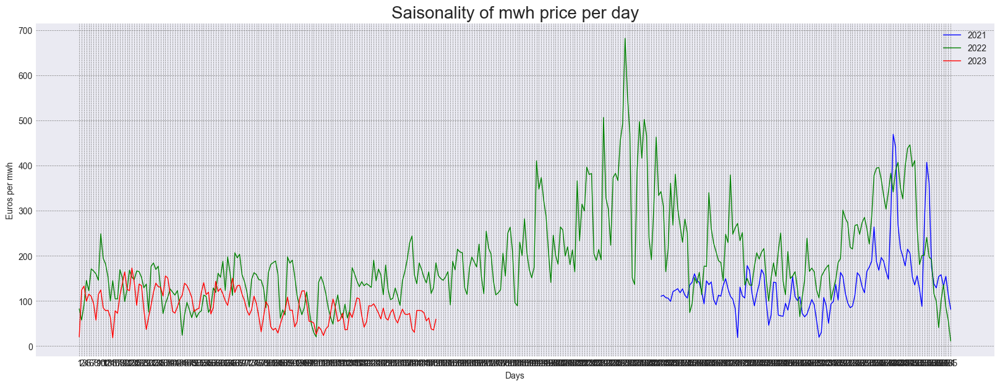

In [573]:
fig, ax = plt.subplots(figsize=(20,7))

ax.plot(daily_avg2021['day'], daily_avg2021['euros_per_mwh'], label='2021', color='b', linestyle='-', linewidth=1)
ax.plot(daily_avg2022['day'], daily_avg2022['euros_per_mwh'], label='2022', color='g', linestyle='-', linewidth=1)
ax.plot(daily_avg2023['day'], daily_avg2023['euros_per_mwh'], label='2023', color='r', linestyle='-', linewidth=1)

ax.set_title('Saisonality of mwh price per day', fontsize=20)
ax.set_xlabel('Days')
ax.set_ylabel('Euros per mwh')
ax.set_xticks(daily_avg2022['day'])

ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax.legend()

## 2.5 - Electricity price overall evolution

In [574]:
elec_price2['forecast_date'] = pd.to_datetime(elec_price['forecast_date'])
elec_price2['forecast_year'] = elec_price2['forecast_date'].dt.year

In [575]:
elec2021 = elec_price2[elec_price2['forecast_year']== 2021]
elec2022 = elec_price2[elec_price2['forecast_year']== 2022]
elec2023 = elec_price2[elec_price2['forecast_year']== 2023]

In [576]:
elec_price3 = elec_price2.copy()
elec_price3 = elec_price3.set_index('forecast_date')

In [577]:
# Create moving average feature to show the trend

moving_average = elec_price3['euros_per_mwh'].rolling(
    window=365,
    center=True,
    min_periods=183,
).mean()

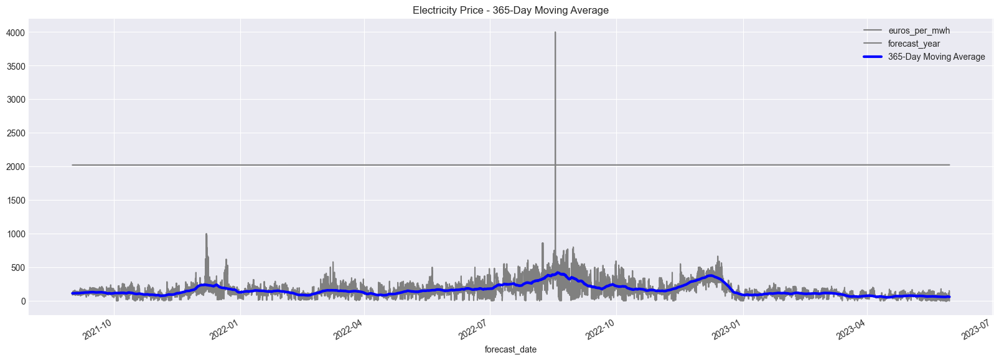

In [578]:
fig, ax = plt.subplots(figsize=(20, 7))

ax = elec_price3.plot(ax=ax, style="-", color="0.5", label='Electricity Price')
moving_average.plot(ax=ax, linewidth=3, label='365-Day Moving Average', color='b')
ax.set_title("Electricity Price - 365-Day Moving Average")
ax.legend()
plt.show()

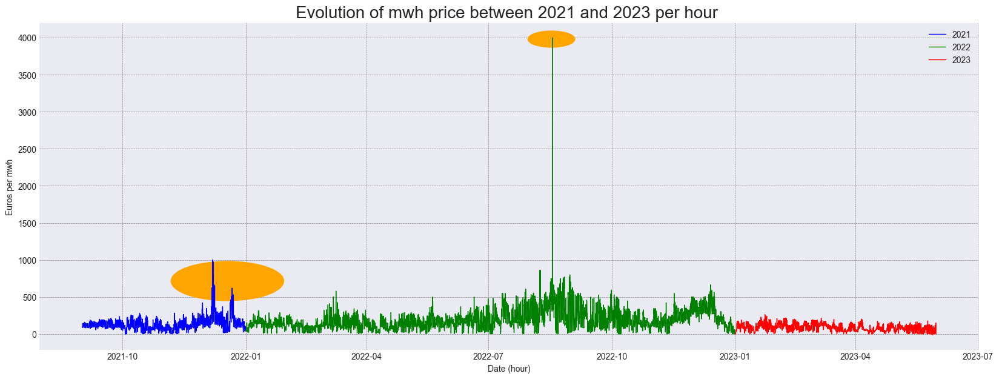

In [579]:
# Distinguish the years in different colors and highlight what could be outliers to analyze afterward.

fig, ax = plt.subplots(figsize=(20,7))


ax.plot(elec2021['forecast_date'], elec2021['euros_per_mwh'], label='2021', color='b', linestyle='-', linewidth=1)
ax.plot(elec2022['forecast_date'], elec2022['euros_per_mwh'], label='2022', color='g', linestyle='-', linewidth=1)
ax.plot(elec2023['forecast_date'], elec2023['euros_per_mwh'], label='2023', color='r', linestyle='-', linewidth=1)

ax.set_title('Evolution of mwh price between 2021 and 2023 per hour ', fontsize=20)
ax.set_xlabel('Date (hour)')
ax.set_ylabel('Euros per mwh')

circle = plt.Circle((0.2, 0.21), 0.06, color='orange', transform=ax.transAxes, clip_on=False)
circle2 = plt.Circle((0.545, 0.95), 0.025, color='orange', transform=ax.transAxes, clip_on=False)
ax.add_artist(circle)
ax.add_artist(circle2)


ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax.legend()

plt.show()

In [580]:
# Analyze the first potential outlier

start_date='2021-12-01 00:00:00'
end_date='2022-01-01 00:00:00'

filter_data = elec_price2[(elec_price2['forecast_date'] > start_date) & (elec_price2['forecast_date'] < end_date)]

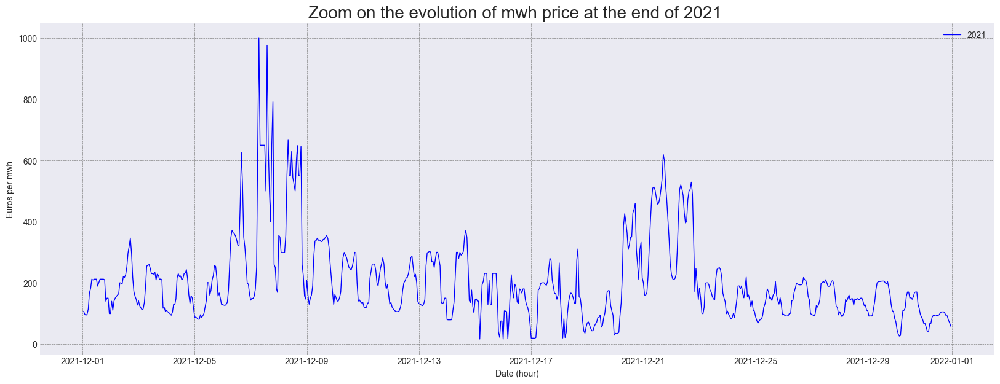

In [581]:
fig, ax = plt.subplots(figsize=(20,7))


ax.plot(filter_data['forecast_date'], filter_data['euros_per_mwh'], label='2021', color='b', linestyle='-', linewidth=1)


ax.set_title('Zoom on the evolution of mwh price at the end of 2021 ', fontsize=20)
ax.set_xlabel('Date (hour)')
ax.set_ylabel('Euros per mwh')

ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax.legend()

plt.show()

In [582]:
# Analyze the second potential outlier

start_date='2022-08-17 00:00:00'
end_date='2022-08-17 23:00:00'

filter_data = elec_price2[(elec_price2['forecast_date'] > start_date) & (elec_price2['forecast_date'] < end_date)]

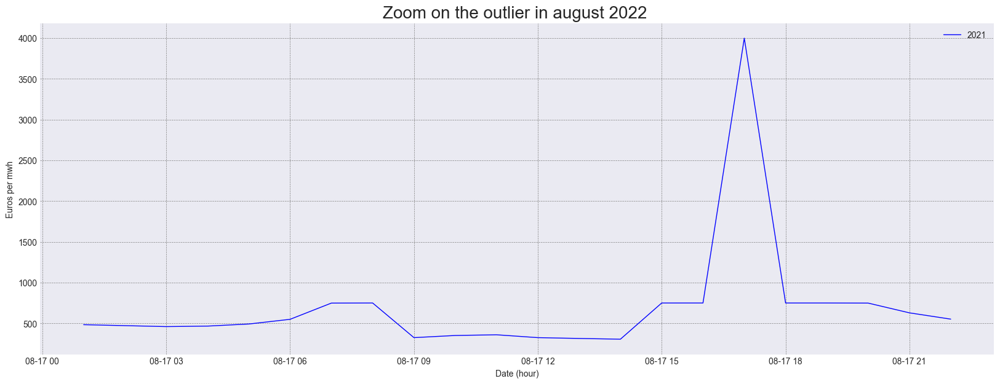

In [583]:
fig, ax = plt.subplots(figsize=(20,7))


ax.plot(filter_data['forecast_date'], filter_data['euros_per_mwh'], label='2021', color='b', linestyle='-', linewidth=1)


ax.set_title('Zoom on the outlier in august 2022 ', fontsize=20)
ax.set_xlabel('Date (hour)')
ax.set_ylabel('Euros per mwh')

ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax.legend()

plt.show()

## 2.6 - Outliers detection

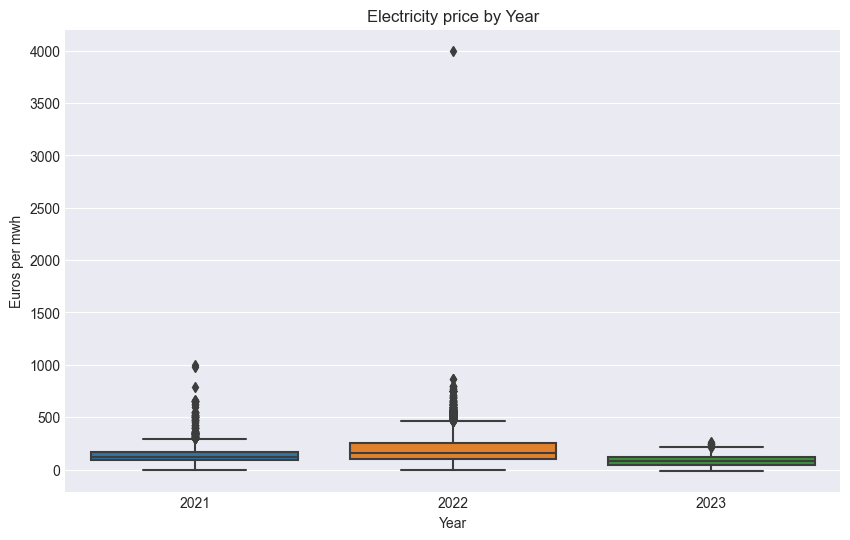

In [584]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='forecast_year', y='euros_per_mwh', data=elec_price2)
plt.title('Electricity price by Year')
plt.xlabel('Year')
plt.ylabel('Euros per mwh')
plt.show()

In [585]:
elec_price2[elec_price2['euros_per_mwh'] < 0]

,forecast_date,euros_per_mwh,forecast_year
11666,2022-12-31 03:00:00,-0.04,2022
11667,2022-12-31 04:00:00,-0.01,2022
14555,2023-04-30 13:00:00,-0.08,2023
14556,2023-04-30 14:00:00,-0.92,2023
15034,2023-05-20 12:00:00,-0.15,2023
15035,2023-05-20 13:00:00,-0.55,2023
15036,2023-05-20 14:00:00,-0.09,2023
15057,2023-05-21 11:00:00,-0.48,2023
15058,2023-05-21 12:00:00,-1.11,2023
15059,2023-05-21 13:00:00,-1.11,2023


In [586]:
elec_price2[elec_price2['euros_per_mwh'] > 3000]

,forecast_date,euros_per_mwh,forecast_year
8416,2022-08-17 17:00:00,4000.0,2022


## 2.7 Conclusion

Based on the analyses conducted above, several conclusions can be drawn:

1. There appears to be some seasonality. Indeed, towards the end of the year, electricity prices seem to be higher, which can be expected assuming higher demand, particularly in an eastern country like Estonia.

2. The overall price trend seems to be rather constant, with prices below 500 euros. At certain times of the year, there are more significant variations, which can likely be explained by local and possibly political phenomena. 

3. The war in Ukraine beginning in 2022 appears to affect electricity prices. Indeed, prices in 2022 are higher than those in 2021 and 2023, although they remain within a reasonable price range.

4. Two outliers were detected. One seems peculiar with a price around 4000 euros that appears on only one data point. It can be removed later. We might assume that the spike due to the war in Ukraine is understandable. However, the strategy will be to remove it because it could introduce issues into our forecasting models.

# 3 - Gas EDA

In [587]:
gas_price.head(2)

,forecast_date,lowest_price_per_mwh,highest_price_per_mwh,origin_date,data_block_id
0,2021-09-01,45.23,46.32,2021-08-31,1
1,2021-09-02,45.62,46.29,2021-09-01,2


In [588]:
dataset_presentation(gas_price)

                    
                    
General introduction
                    
Shape : (637, 5)
                    
--------------------
forecast_date is the following type : object
forecast_date percentage missinge value : 0.0%
--------------------
--------------------
lowest_price_per_mwh is the following type : float64
lowest_price_per_mwh percentage missinge value : 0.0%
--------------------
--------------------
highest_price_per_mwh is the following type : float64
highest_price_per_mwh percentage missinge value : 0.0%
--------------------
--------------------
origin_date is the following type : object
origin_date percentage missinge value : 0.0%
--------------------
--------------------
data_block_id is the following type : int64
data_block_id percentage missinge value : 0.0%
--------------------
Lucky, no column to clean because of missing values ✅


In [589]:
gas_price['forecast_date'].min() , gas_price['forecast_date'].max()

('2021-09-01', '2023-05-30')

## 3.0 - Questions

I am going to study in detail in this section the dataset related to gas price. This section will look like the electricity section, as the datasets are almost the same. In particular, i'll try to answer the following questions:

1. What's the weekly price trend? Are there any major changes between years?
2. What's the monthly price trend? Are there any major changes between years?
3. What's the daily price trend? Are there any major changes between years?
4. What is the overall price evolution, hours per hours?
5. Do the electricity price and gas price follow the same trend  ? 
6. Are there any outliers?

## 3.1 - Setup

In [435]:
gas_price2 = gas_price.copy()

In [591]:
gas_price2['forecast_date'].min() , gas_price2['forecast_date'].max()

('2021-09-01', '2023-05-30')

In [592]:
# Create a calendar dataset with the appropriate frequency so that I can resample the data more easily afterward

calendar_gas = pd.date_range(start='2021-09-01', end='2023-05-30', freq='D')
calendar_gas_df = pd.DataFrame(calendar_gas, columns=['datetime'])
calendar_gas = calendar_gas_df.join(gas_price2)

calendar_gas.set_index('datetime', inplace=True)
calendar_gas.drop(columns=['forecast_date','origin_date','data_block_id'],inplace=True)
calendar_gas['daily_price_diff'] = calendar_gas['highest_price_per_mwh'] - calendar_gas['lowest_price_per_mwh']
calendar_gas.head(8)

,lowest_price_per_mwh,highest_price_per_mwh,daily_price_diff
datetime,,,
2021-09-01,45.23,46.32,1.09
2021-09-02,45.62,46.29,0.67
2021-09-03,45.85,46.40,0.55
2021-09-04,46.30,46.80,0.50
2021-09-05,46.30,46.58,0.28
2021-09-06,46.17,46.95,0.78
2021-09-07,46.35,47.60,1.25
2021-09-08,46.40,47.64,1.24


## 3.2 - Gas price evolution per week 

In [593]:
# Resample the data with a weekly frequency

weekly_avg_gas = calendar_gas.resample('W').mean()

In [594]:
# Create new features that will be usefull to study the data per week

weekly_avg_gas['year'] = weekly_avg_gas.index.year
weekly_avg_gas['week'] = weekly_avg_gas.index.week

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_9828/4225888643.py:2: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  weekly_avg_gas['week'] = weekly_avg_gas.index.week


In [595]:
# Create three distinguish datasets to plot data per year

weekly_avg_gas_2021 = weekly_avg_gas[weekly_avg_gas['year'] == 2021]
weekly_avg_gas_2022 = weekly_avg_gas[weekly_avg_gas['year'] == 2022]
weekly_avg_gas_2023 = weekly_avg_gas[weekly_avg_gas['year'] == 2023]

In [596]:
# Clean the data so the plot can be easier to read

weekly_avg_gas_2022.index.sort_values
weekly_avg_gas_2022['week'] = weekly_avg_gas_2022['week'] + 1
weekly_avg_gas_2022.loc['2022-01-02','week'] = 1

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_9828/958445225.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weekly_avg_gas_2022['week'] = weekly_avg_gas_2022['week'] + 1


In [597]:
weekly_avg_gas_2023.index.sort_values
weekly_avg_gas_2023['week'] = weekly_avg_gas_2023['week'] + 1
weekly_avg_gas_2023.loc['2023-01-01','week'] = 1

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_9828/3551206435.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weekly_avg_gas_2023['week'] = weekly_avg_gas_2023['week'] + 1


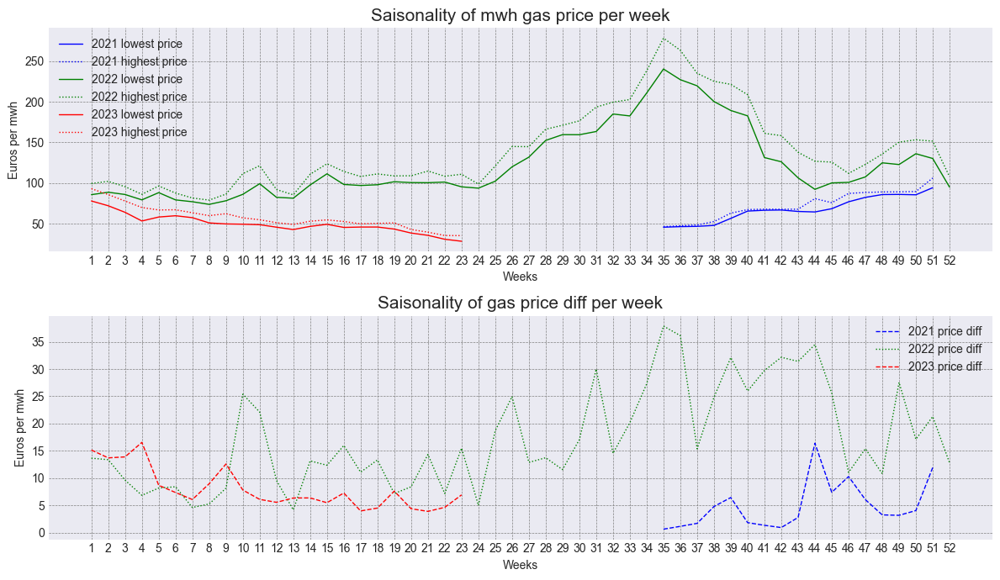

In [598]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,7))

ax1.plot(weekly_avg_gas_2021['week'], weekly_avg_gas_2021['lowest_price_per_mwh'], label='2021 lowest price', color='b', linestyle='-', linewidth=1)
ax1.plot(weekly_avg_gas_2021['week'], weekly_avg_gas_2021['highest_price_per_mwh'], label='2021 highest price', color='b', linestyle=':', linewidth=1)
ax2.plot(weekly_avg_gas_2021['week'], weekly_avg_gas_2021['daily_price_diff'], label='2021 price diff', color='b', linestyle='--', linewidth=1)

ax1.plot(weekly_avg_gas_2022['week'], weekly_avg_gas_2022['lowest_price_per_mwh'], label='2022 lowest price', color='g', linestyle='-', linewidth=1)
ax1.plot(weekly_avg_gas_2022['week'], weekly_avg_gas_2022['highest_price_per_mwh'], label='2022 highest price', color='g', linestyle=':', linewidth=1)
ax2.plot(weekly_avg_gas_2022['week'], weekly_avg_gas_2022['daily_price_diff'], label='2022 price diff', color='g', linestyle=':', linewidth=1)

ax1.plot(weekly_avg_gas_2023['week'], weekly_avg_gas_2023['lowest_price_per_mwh'], label='2023 lowest price', color='r', linestyle='-', linewidth=1)
ax1.plot(weekly_avg_gas_2023['week'], weekly_avg_gas_2023['highest_price_per_mwh'], label='2023 highest price', color='r', linestyle=':', linewidth=1)
ax2.plot(weekly_avg_gas_2023['week'], weekly_avg_gas_2023['daily_price_diff'], label='2023 price diff', color='r', linestyle='--', linewidth=1)

ax1.set_title('Saisonality of mwh gas price per week', fontsize=15)
ax2.set_title('Saisonality of gas price diff per week', fontsize=15)

ax1.set_xlabel('Weeks')
ax2.set_xlabel('Weeks')

ax1.set_ylabel('Euros per mwh')
ax2.set_ylabel('Euros per mwh')

ax1.set_xticks(weekly_avg2022['week'])
ax2.set_xticks(weekly_avg2022['week'])

ax1.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')

ax1.legend()
ax2.legend()

plt.tight_layout()
plt.show()

## 3.3 - Gas price per month

The same process will be use below to study the data per month

In [599]:
monthly_avg_gas = calendar_gas.resample('M').mean()

In [600]:
monthly_avg_gas['month'] = monthly_avg_gas.index.month
monthly_avg_gas['year'] = monthly_avg_gas.index.year
monthly_avg_gas.head()

,lowest_price_per_mwh,highest_price_per_mwh,daily_price_diff,month,year
datetime,,,,,
2021-09-30,47.275000,50.459667,3.184667,9,2021
2021-10-31,66.123226,67.841613,1.718387,10,2021
2021-11-30,74.041333,83.644333,9.603000,11,2021
2021-12-31,87.938387,94.965484,7.027097,12,2021
2022-01-31,85.480000,95.457097,9.977097,1,2022


In [601]:
monthly_avg_gas_2021 = monthly_avg_gas[monthly_avg_gas['year'] == 2021]
monthly_avg_gas_2022 = monthly_avg_gas[monthly_avg_gas['year'] == 2022]
monthly_avg_gas_2023 = monthly_avg_gas[monthly_avg_gas['year'] == 2023]

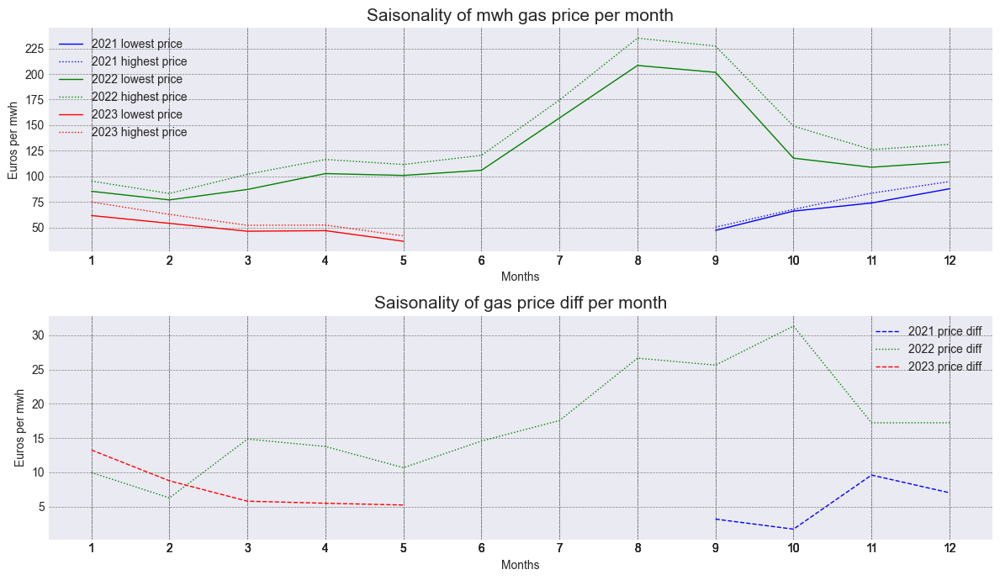

In [602]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,7))

ax1.plot(monthly_avg_gas_2021['month'], monthly_avg_gas_2021['lowest_price_per_mwh'], label='2021 lowest price', color='b', linestyle='-', linewidth=1)
ax1.plot(monthly_avg_gas_2021['month'], monthly_avg_gas_2021['highest_price_per_mwh'], label='2021 highest price', color='b', linestyle=':', linewidth=1)
ax2.plot(monthly_avg_gas_2021['month'], monthly_avg_gas_2021['daily_price_diff'], label='2021 price diff', color='b', linestyle='--', linewidth=1)

ax1.plot(monthly_avg_gas_2022['month'], monthly_avg_gas_2022['lowest_price_per_mwh'], label='2022 lowest price', color='g', linestyle='-', linewidth=1)
ax1.plot(monthly_avg_gas_2022['month'], monthly_avg_gas_2022['highest_price_per_mwh'], label='2022 highest price', color='g', linestyle=':', linewidth=1)
ax2.plot(monthly_avg_gas_2022['month'], monthly_avg_gas_2022['daily_price_diff'], label='2022 price diff', color='g', linestyle=':', linewidth=1)

ax1.plot(monthly_avg_gas_2023['month'], monthly_avg_gas_2023['lowest_price_per_mwh'], label='2023 lowest price', color='r', linestyle='-', linewidth=1)
ax1.plot(monthly_avg_gas_2023['month'], monthly_avg_gas_2023['highest_price_per_mwh'], label='2023 highest price', color='r', linestyle=':', linewidth=1)
ax2.plot(monthly_avg_gas_2023['month'], monthly_avg_gas_2023['daily_price_diff'], label='2023 price diff', color='r', linestyle='--', linewidth=1)

ax1.set_title('Saisonality of mwh gas price per month', fontsize=15)
ax2.set_title('Saisonality of gas price diff per month', fontsize=15)

ax1.set_xlabel('Months')
ax2.set_xlabel('Months')

ax1.set_ylabel('Euros per mwh')
ax2.set_ylabel('Euros per mwh')

ax1.set_xticks(weekly_avg2022['month'])
ax2.set_xticks(weekly_avg2022['month'])

ax1.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')

ax1.legend()
ax2.legend()

plt.tight_layout()
plt.show()

## 3.4 - Gas price evolution per day

The same process will be used below to study the data per day

In [603]:
calendar_gas_daily = calendar_gas.copy()

In [604]:
calendar_gas_daily['year'] = calendar_gas_daily.index.year

In [605]:
calendar_gas_daily_2021 = calendar_gas_daily[calendar_gas_daily['year']==2021]
calendar_gas_daily_2022 = calendar_gas_daily[calendar_gas_daily['year']==2022]
calendar_gas_daily_2023 = calendar_gas_daily[calendar_gas_daily['year']==2023]

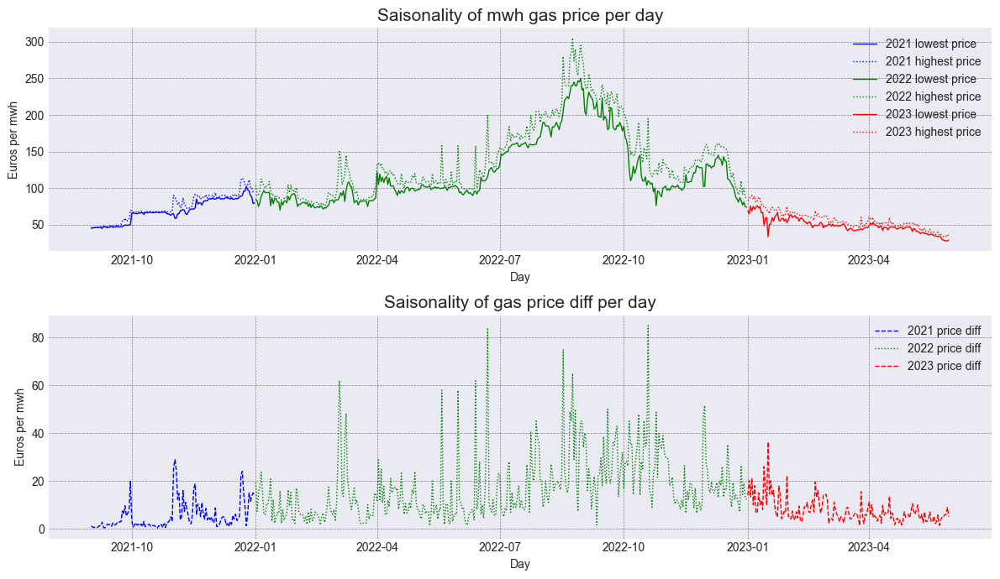

In [606]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,7))

ax1.plot(calendar_gas_daily_2021['lowest_price_per_mwh'], label='2021 lowest price', color='b', linestyle='-', linewidth=1)
ax1.plot(calendar_gas_daily_2021['highest_price_per_mwh'], label='2021 highest price', color='b', linestyle=':', linewidth=1)
ax2.plot(calendar_gas_daily_2021['daily_price_diff'], label='2021 price diff', color='b', linestyle='--', linewidth=1)

ax1.plot(calendar_gas_daily_2022['lowest_price_per_mwh'], label='2022 lowest price', color='g', linestyle='-', linewidth=1)
ax1.plot(calendar_gas_daily_2022['highest_price_per_mwh'], label='2022 highest price', color='g', linestyle=':', linewidth=1)
ax2.plot(calendar_gas_daily_2022['daily_price_diff'], label='2022 price diff', color='g', linestyle=':', linewidth=1)

ax1.plot(calendar_gas_daily_2023['lowest_price_per_mwh'], label='2023 lowest price', color='r', linestyle='-', linewidth=1)
ax1.plot(calendar_gas_daily_2023['highest_price_per_mwh'], label='2023 highest price', color='r', linestyle=':', linewidth=1)
ax2.plot(calendar_gas_daily_2023['daily_price_diff'], label='2023 price diff', color='r', linestyle='--', linewidth=1)

ax1.set_title('Saisonality of mwh gas price per day', fontsize=15)
ax2.set_title('Saisonality of gas price diff per day', fontsize=15)

ax1.set_xlabel('Day')
ax2.set_xlabel('Day')

ax1.set_ylabel('Euros per mwh')
ax2.set_ylabel('Euros per mwh')

ax1.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')

ax1.legend()
ax2.legend()

plt.tight_layout()
plt.show()

## 3.5 - Gas price and electricity price

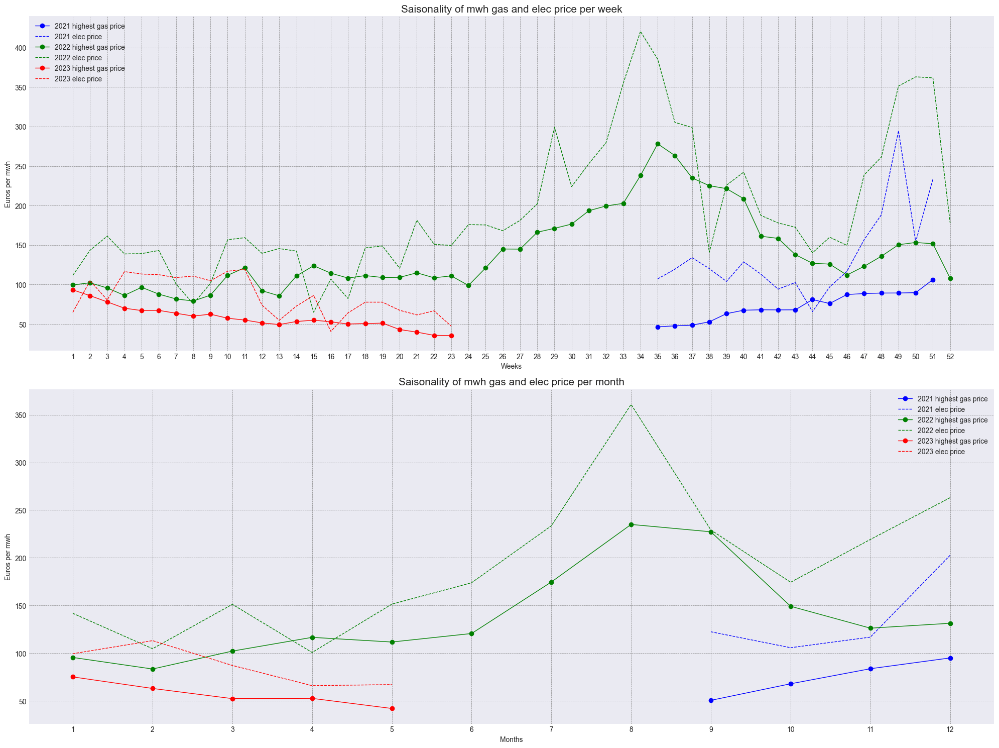

In [607]:
fig, (ax1, ax2) = plt.subplots(2,1,figsize=(20,15))

## Axe 1 : view per week

ax1.plot(weekly_avg_gas_2021['week'], weekly_avg_gas_2021['highest_price_per_mwh'], label='2021 highest gas price', color='b', linestyle='-', marker='o', linewidth=1)
ax1.plot(weekly_avg2021['week'], weekly_avg2021['euros_per_mwh'], label='2021 elec price', color='b', linestyle='--', linewidth=1)

ax1.plot(weekly_avg_gas_2022['week'], weekly_avg_gas_2022['highest_price_per_mwh'], label='2022 highest gas price', color='g', linestyle='-',marker='o', linewidth=1)
ax1.plot(weekly_avg2022['week'], weekly_avg2022['euros_per_mwh'], label='2022 elec price', color='g', linestyle='--', linewidth=1)

ax1.plot(weekly_avg_gas_2023['week'], weekly_avg_gas_2023['highest_price_per_mwh'], label='2023 highest gas price', color='r', linestyle='-',marker='o', linewidth=1)
ax1.plot(weekly_avg2023['week'], weekly_avg2023['euros_per_mwh'], label='2023 elec price', color='r', linestyle='--', linewidth=1)

ax1.set_title('Saisonality of mwh gas and elec price per week', fontsize=15)
ax1.set_xlabel('Weeks')
ax1.set_ylabel('Euros per mwh')
ax1.set_xticks(weekly_avg2022['week'])
ax1.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax1.legend()



## Axe 2 ; view per month

ax2.plot(monthly_avg_gas_2021['month'], monthly_avg_gas_2021['highest_price_per_mwh'], label='2021 highest gas price', color='b', linestyle='-', marker='o', linewidth=1)
ax2.plot(month_avg2021['month'], month_avg2021['euros_per_mwh'], label='2021 elec price', color='b', linestyle='--', linewidth=1)

ax2.plot(monthly_avg_gas_2022['month'], monthly_avg_gas_2022['highest_price_per_mwh'], label='2022 highest gas price', color='g', linestyle='-',marker='o', linewidth=1)
ax2.plot(month_avg2022['month'], month_avg2022['euros_per_mwh'], label='2022 elec price', color='g', linestyle='--', linewidth=1)

ax2.plot(monthly_avg_gas_2023['month'], monthly_avg_gas_2023['highest_price_per_mwh'], label='2023 highest gas price', color='r', linestyle='-',marker='o', linewidth=1)
ax2.plot(month_avg2023['month'], month_avg2023['euros_per_mwh'], label='2023 elec price', color='r', linestyle='--', linewidth=1)

ax2.set_title('Saisonality of mwh gas and elec price per month', fontsize=15)
ax2.set_xlabel('Months')
ax2.set_ylabel('Euros per mwh')
ax2.set_xticks(month_avg2022['month'])
ax2.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax2.legend()


plt.tight_layout()
plt.show()

## 3.6 - Gas price overall evolution

In [407]:
gas_price3 = gas_price2.copy()
gas_price3 = gas_price3.set_index('forecast_date')
gas_price3

NameError: name 'gas_price2' is not defined

In [406]:
# Create moving average features to show the trend of the electricity price

moving_average_gas_highest = gas_price3['highest_price_per_mwh'].rolling(
    window=30,
    center=True,
    min_periods=15,
).mean()

moving_average_gas_lowest = gas_price3['lowest_price_per_mwh'].rolling(
    window=30,
    center=True,
    min_periods=15,
).mean()

NameError: name 'gas_price3' is not defined

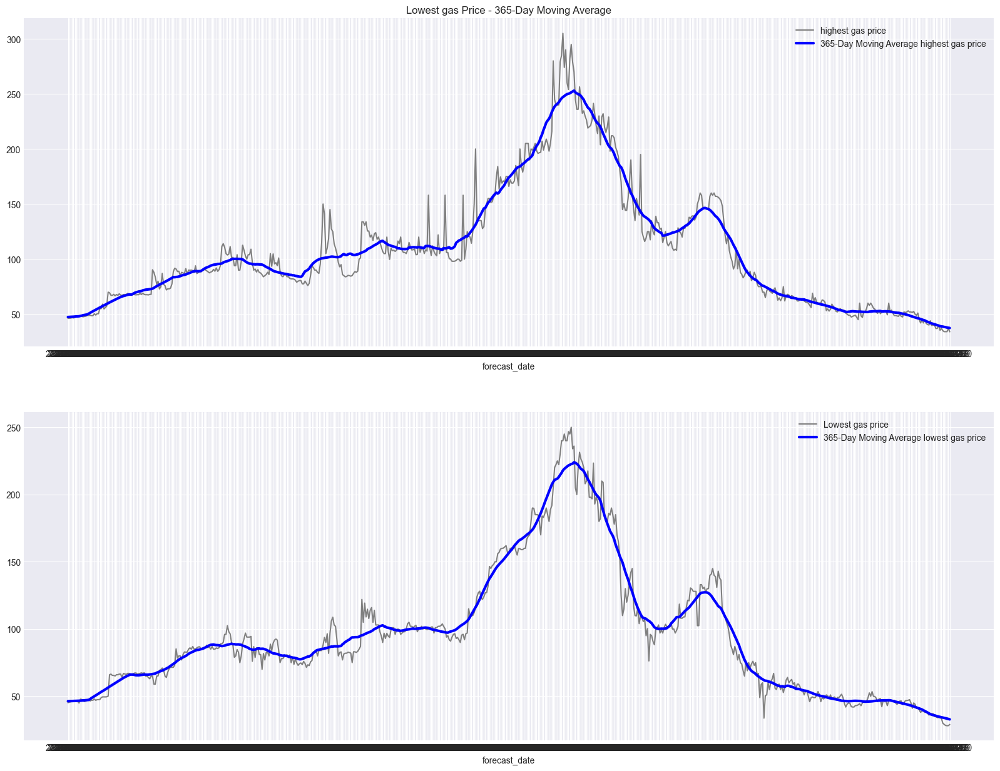

In [610]:
fig, (ax1, ax2) = plt.subplots(2,1,figsize=(20, 15))

ax1.plot(gas_price3['highest_price_per_mwh'], linestyle="-", color="0.5", label='highest gas price')
moving_average_gas_highest.plot(ax=ax1, linewidth=3, label='365-Day Moving Average highest gas price', color='b')
ax1.set_title("Highest gas Price - 365-Day Moving Average")

ax2.plot(gas_price3['lowest_price_per_mwh'], linestyle="-", color="0.5", label='Lowest gas price')
moving_average_gas_lowest.plot(ax=ax2, linewidth=3, label='365-Day Moving Average lowest gas price', color='b')
ax1.set_title("Lowest gas Price - 365-Day Moving Average")

ax1.legend()
ax2.legend()

plt.show()

## 3.7 - Outliers detection

In [611]:
calendar_gas['year'] = calendar_gas.index.year
calendar_gas

,lowest_price_per_mwh,highest_price_per_mwh,daily_price_diff,year
datetime,,,,
2021-09-01,45.23,46.32,1.09,2021
2021-09-02,45.62,46.29,0.67,2021
2021-09-03,45.85,46.40,0.55,2021
2021-09-04,46.30,46.80,0.50,2021
2021-09-05,46.30,46.58,0.28,2021
...,...,...,...,...
2023-05-26,29.10,34.10,5.00,2023
2023-05-27,28.30,34.10,5.80,2023
2023-05-28,28.10,34.10,6.00,2023


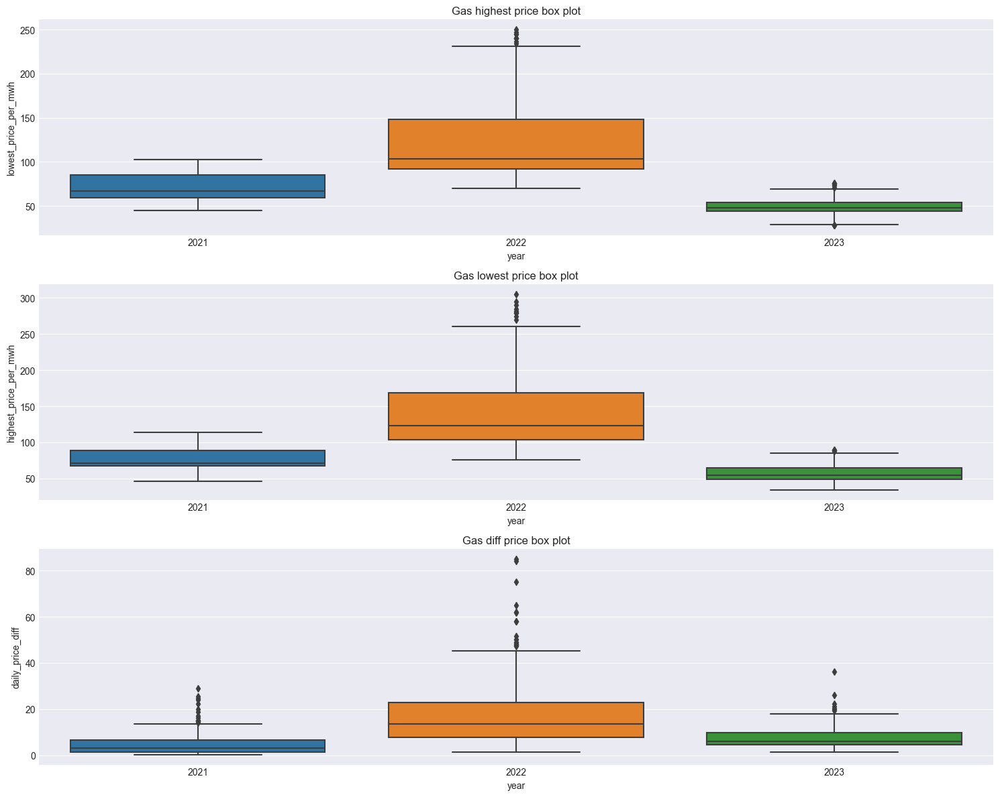

In [612]:
fig, (ax1, ax2, ax3) = plt.subplots(3,1,figsize=(15, 12))
sns.boxplot(x='year', y='lowest_price_per_mwh', data=calendar_gas, ax=ax1)
sns.boxplot(x='year', y='highest_price_per_mwh', data=calendar_gas, ax=ax2)
sns.boxplot(x='year', y='daily_price_diff', data=calendar_gas, ax=ax3)

ax1.set_title('Gas highest price box plot')
ax2.set_title('Gas lowest price box plot')
ax3.set_title('Gas diff price box plot')

plt.tight_layout()
plt.show()

## 3.8 Conclusion

Based on the analyses conducted above, several conclusions can be drawn:

1. It appears that there is a seasonality effect in gas prices. Indeed, prices seem to decrease as summer approaches and increase as winter approaches.

2. The year 2022 seems particularly more expensive in terms of prices compared to 2021 and 2023. One can assume that the beginning of the war in Ukraine heavily impacted the Estonian gas market as it did in Western Europe. Unfortunately, we do not have enough data for 2021 and 2023 to conduct a complete week-by-week study and compare it to 2022.

3. Variations between the high and low prices of gas per day are far from constant; significant variations are recorded between these two prices, indicating that the gas market is tight.

4. Gas prices appear to return to more reasonable levels in 2023 compared to 2022.

5. The gas market and the electricity market seem to exhibit similar behavior. Indeed, price trends are similar for these two markets, both showing a significant increase in 2022 following the war in Ukraine.

6. 2022 will be an interesting year to analyze for prosumers due to the tight market and high prices for both gas and electricity.

7. No clear outliers have been detected. The one showed by the box plot can be explained and are not too far from the median


# 4 - Client EDA

In [613]:
client2 = client.copy()

In [614]:
dataset_presentation(client2)

                    
                    
General introduction
                    
Shape : (41919, 7)
                    
--------------------
product_type is the following type : int64
product_type percentage missinge value : 0.0%
--------------------
--------------------
county is the following type : int64
county percentage missinge value : 0.0%
--------------------
--------------------
eic_count is the following type : int64
eic_count percentage missinge value : 0.0%
--------------------
--------------------
installed_capacity is the following type : float64
installed_capacity percentage missinge value : 0.0%
--------------------
--------------------
is_business is the following type : int64
is_business percentage missinge value : 0.0%
--------------------
--------------------
date is the following type : object
date percentage missinge value : 0.0%
--------------------
--------------------
data_block_id is the following type : int64
data_block_id percentage missinge value : 0.0%

## 4.0 - Questions

I am going to study in detail in this section the dataset related to clients and their solar installed capacity with solar panels. In particular, i'll try to answer the following questions:

1. What is the evolution of installed capacity among clients? 
2. According to county? 
3. Per contract type?
4. And based on whether they are businesses or not?

## 4.1 Setup

In [615]:
client2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41919 entries, 0 to 41918
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   product_type        41919 non-null  int64  
 1   county              41919 non-null  int64  
 2   eic_count           41919 non-null  int64  
 3   installed_capacity  41919 non-null  float64
 4   is_business         41919 non-null  int64  
 5   date                41919 non-null  object 
 6   data_block_id       41919 non-null  int64  
dtypes: float64(1), int64(5), object(1)
memory usage: 2.2+ MB


In [408]:
client2['date'] = pd.to_datetime(client2['date'], format='%Y-%m-%d')

# Create 2 datasets, one for the business clients only and another for non business clients
client2_business = client2[client2['is_business']==1]
client2_not_business = client2[client2['is_business']==0]

NameError: name 'client2' is not defined

## 4.2 Installed capacity evolution

### 4.2.1 - Global view

In [617]:
client2['is_business'].value_counts()

1    22501
0    19418
Name: is_business, dtype: int64

In [618]:
# Groupby data so that we can easily plot the installed capacity

installed_capacity_global1 =client2_business.groupby(by='date').sum() ['installed_capacity']
installed_capacity_global2 = client2_not_business.groupby(by='date').sum()['installed_capacity']

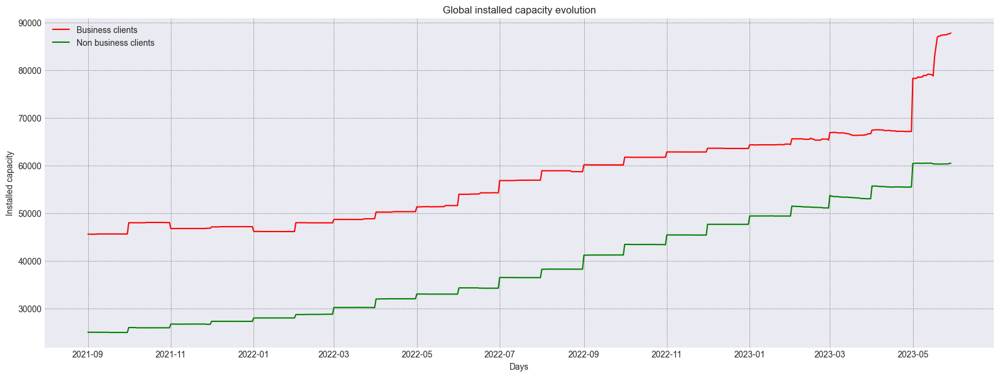

In [619]:
fig, ax = plt.subplots(figsize=(20,7))

ax.plot(installed_capacity_global1, label='Business clients' , color='r')
ax.plot(installed_capacity_global2, label='Non business clients' , color='g')

ax.set_title('Global installed capacity evolution')
ax.set_xlabel('Days')
ax.set_ylabel('Installed capacity')
ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax.legend()

plt.show()


### 4.2.2 - View per county

In [620]:
pivot_df_business = client2_business.pivot_table(index='date', columns='county', values='installed_capacity', aggfunc='sum')
pivot_df_not_business = client2_not_business.pivot_table(index='date', columns='county', values='installed_capacity', aggfunc='sum')

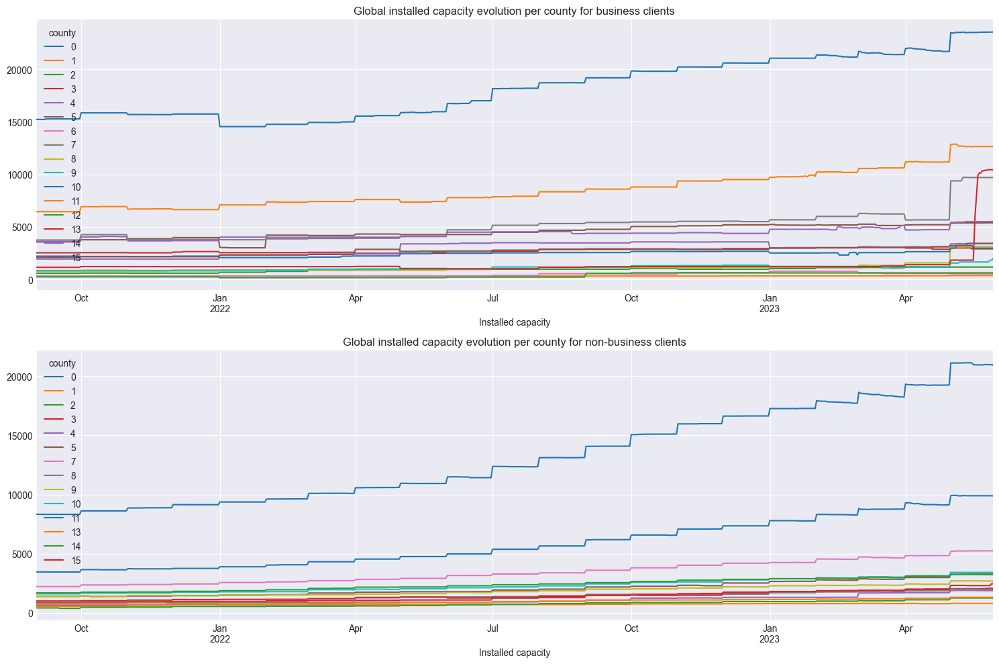

In [621]:
fig, (ax1,ax2) = plt.subplots(2,1,figsize=(15,10))

pivot_df_business.plot(ax=ax1)
pivot_df_not_business.plot(ax=ax2)

ax1.set_title('Global installed capacity evolution per county for business clients')
ax1.set_xlabel('Installed capacity')

ax2.set_title('Global installed capacity evolution per county for non-business clients')
ax2.set_xlabel('Installed capacity')

ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax.legend()
plt.tight_layout()
plt.show()

### 4.2.3 - View per contract type

In [622]:
pivot_df2_business = client2_business.pivot_table(index='date', columns='product_type', values='installed_capacity', aggfunc='sum')
pivot_df2_not_business = client2_not_business.pivot_table(index='date', columns='product_type', values='installed_capacity', aggfunc='sum')

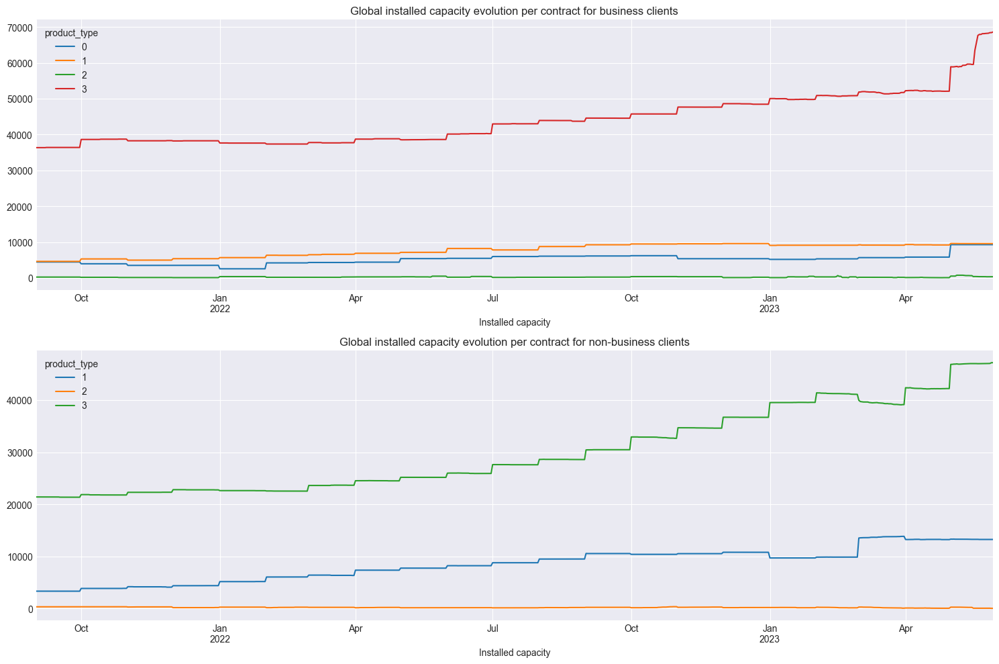

In [623]:
fig, (ax1,ax2) = plt.subplots(2,1,figsize=(15,10))

pivot_df2_business.plot(ax=ax1)
pivot_df2_not_business.plot(ax=ax2)

ax1.set_title('Global installed capacity evolution per contract for business clients')
ax1.set_xlabel('Installed capacity')

ax2.set_title('Global installed capacity evolution per contract for non-business clients')
ax2.set_xlabel('Installed capacity')

ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax.legend()
plt.tight_layout()
plt.show()

## 4.3 - Conclusion

Based on the analyses conducted above, several conclusions can be drawn:

1. Business-type clients have a higher overall installed capacity than non-business-type clients. However, the growth of these two client types appears to be similar over time.

2. Some counties seem to have low total installed capacity. One county stands out in terms of installed capacity for both business and non-business clients—County number 11. It would be interesting to study the specifics of this county (more sunlight? Wealthier clients?).

3. Regarding contracts, different behaviors are observed depending on the client types:
- For business-type clients, Contract 3 seems to be significantly favored over others. Contract 3 corresponds to the spot product and is more suitable for enterprises. Companies might engage in spot contracts to buy additional energy on short notice or sell excess energy based on immediate market conditions. Note that this contract is not used at all by non-business clients, indicating it is dedicated to businesses.

- For non-business clients, Contracts 3 (General Service Contract) and 1 (Combined Contract) appear to be preferred over Contract 2, which is almost not used. The specifics and benefits of these contracts are more oriented towards individuals, explaining these preferences in choices.

# 5 - Weather historical data EDA

## 5.0 - Questions

I am going to study in detail in this section the dataset related to historical weather. My analysis will focus on solar features, as the subject pertains to prosumers who consume solar energy. In particular, i'll try to answer the following questions:

1. Where are the weather stations located in Estonia?
2. What is the evolution over time of sun-related meteorological characteristics?
3. Are there significant differences between the stations?
4. Are there significant correlations between the features?
5. Are there any clear trends between electricity and gas prices and temperatures?

## 5.1 - Setup

In [461]:
weather_hist2 = weather_hist.copy()

In [13]:
dataset_presentation(weather_hist2)

                    
                    
General introduction
                    
Shape : (1710802, 18)
                    
--------------------
datetime is the following type : object
datetime percentage missinge value : 0.0%
--------------------
--------------------
temperature is the following type : float64
temperature percentage missinge value : 0.0%
--------------------
--------------------
dewpoint is the following type : float64
dewpoint percentage missinge value : 0.0%
--------------------
--------------------
rain is the following type : float64
rain percentage missinge value : 0.0%
--------------------
--------------------
snowfall is the following type : float64
snowfall percentage missinge value : 0.0%
--------------------
--------------------
surface_pressure is the following type : float64
surface_pressure percentage missinge value : 0.0%
--------------------
--------------------
cloudcover_total is the following type : int64
cloudcover_total percentage missinge value

In [32]:
weather_hist2.head(2)

,datetime,temperature,dewpoint,rain,snowfall,surface_pressure,cloudcover_total,cloudcover_low,cloudcover_mid,cloudcover_high,windspeed_10m,winddirection_10m,shortwave_radiation,direct_solar_radiation,diffuse_radiation,latitude,longitude,data_block_id,city
0,2021-09-01,14.2,11.6,0.0,0.0,1015.9,31,31,0,11,7.083333,8,0.0,0.0,0.0,57.6,21.7,1.0,0
1,2021-09-01,13.9,11.5,0.0,0.0,1010.7,33,37,0,0,5.111111,359,0.0,0.0,0.0,57.6,22.2,1.0,1


In [15]:
# Create a unique column for each coordinate pair
weather_hist2['city'] = pd.factorize(weather_hist2[['latitude','longitude']].apply(tuple,axis=1))[0]

In [16]:
weather_hist2['datetime'] = pd.to_datetime(weather_hist2['datetime'], format='%Y-%m-%d %H:%M:%S')
weather_hist2.set_index('datetime');

## 5.2 - Show Estonian stations on a map

In [29]:
weather_hist_cities = weather_hist2.groupby(by='city').max()
weather_hist_cities = weather_hist_cities.reset_index()

In [31]:
# Calculate average coordinates to center the map
moyenne_latitude = weather_hist_cities['latitude'].mean()
moyenne_longitude = weather_hist_cities['longitude'].mean()

# Create a map centered on average coordinates
carte = folium.Map(location=[moyenne_latitude, moyenne_longitude], zoom_start=6)

# Add point clusters
marker_cluster = MarkerCluster().add_to(carte)

# Adding points to clusters
for _, row in weather_hist_cities.iterrows():
    folium.Marker([row['latitude'], row['longitude']], popup=f"Ville: {row['city']}").add_to(marker_cluster)

carte

## 5.3 - Solar weather evolution

In [38]:
weather_hist3 = weather_hist2[['datetime',
                               'temperature',
                               'shortwave_radiation',
                               'direct_solar_radiation',
                               'diffuse_radiation',
                               'city']]

weather_hist3.head()

,datetime,temperature,shortwave_radiation,direct_solar_radiation,diffuse_radiation,city
0,2021-09-01,14.2,0.0,0.0,0.0,0
1,2021-09-01,13.9,0.0,0.0,0.0,1
2,2021-09-01,14.0,0.0,0.0,0.0,2
3,2021-09-01,14.6,358.0,277.0,81.0,3
4,2021-09-01,15.7,0.0,0.0,0.0,4


In [43]:
# Use pivot table to show data per city and use the data more easily

weather_hist3_pivot = weather_hist3.pivot_table(index='datetime', columns='city', aggfunc='sum');

diffuse_radiation                                          \
city                              0      1      2     3      4     5      6     
datetime                                                                        
2021-09-01 00:00:00               0.0    0.0    0.0  81.0    0.0  75.0    0.0   
2021-09-01 01:00:00               0.0    0.0    0.0  64.0    0.0  64.0    0.0   
2021-09-01 02:00:00               0.0    0.0    0.0  44.0    0.0  41.0    0.0   
2021-09-01 03:00:00               0.0    0.0    0.0  14.0    0.0  10.0    0.0   
2021-09-01 04:00:00               0.0    0.0    0.0   0.0    0.0   0.0    0.0   
...                               ...    ...    ...   ...    ...   ...    ...   
2023-05-30 06:00:00              48.0   51.0   53.0   4.0   55.0   5.0   66.0   
2023-05-30 07:00:00              90.0   90.0   87.0   0.0   96.0   0.0   95.0   
2023-05-30 08:00:00             111.0  103.0   94.0   0.0  116.0   0.0  120.0   
2023-05-30 09:00:00             127.0  128.0  124.0   0.0  128.0   0.0  141.0   
2023-05-30 10:00:00             109.0  111.0  117.0   0.0  161.0   0.0  193.0   

                                          ... temperature                    \
city                   7      8      9    ...         102   103   104   105   
datetime                                  ...                                 
2021-09-01 00:00:00    0.0    0.0    0.0  ...        13.0  15.0  13.9  14.0   
2021-09-01 01:00:00    0.0    0.0    0.0  ...        12.4  14.6  13.3  13.5   
2021-09-01 02:00:00    0.0    0.0    0.0  ...        12.2  14.4  12.7  12.8   
2021-09-01 03:00:00    0.0    0.0    0.0  ...        12.3  14.1  12.3  12.4   
2021-09-01 04:00:00    0.0    0.0    0.0  ...        12.4  14.1  12.1  12.2   
...                    ...    ...    ...  ...         ...   ...   ...   ...   
2023-05-30 06:00:00   71.0   70.0   68.0  ...         9.6   9.6   9.1   9.1   
2023-05-30 07:00:00   93.0  103.0  114.0  ...         9.9   9.6  10.3  10.2   
2023-05-30 08:00:00  121.0  133.0  152.0  ...        10.5   9.7  10.9  10.8   
2023-05-30 09:00:00  147.0  152.0  155.0  ...        11.2   9.8  11.1  10.9   
2023-05-30 10:00:00  192.0  177.0  168.0  ...        12.1  10.1  11.5  11.3   

                                                         
city                  106   107   108   109   110   111  
datetime                                                 
2021-09-01 00:00:00  14.4  14.2  12.0  15.7  12.7  13.3  
2021-09-01 01:00:00  14.4  14.5  12.2  15.8  12.8  13.4  
2021-09-01 02:00:00  14.0  14.1  12.4  15.6  13.0  13.5  
2021-09-01 03:00:00  13.6  13.7  12.2  15.4  13.1  13.4  
2021-09-01 04:00:00  13.4  13.5  12.5  15.0  13.3  13.3  
...                   ...   ...   ...   ...   ...   ...  
2023-05-30 06:00:00   9.5   9.6   9.0   9.7   9.1   9.8  
2023-05-30 07:00:00  10.3  10.4  10.3   9.7  10.0  10.4  
2023-05-30 08:00:00  10.7  10.6  10.8   9.6  10.6  11.2  
2023-05-30 09:00:00  11.1  10.8  11.4   9.5  11.0  11.5  
2023-05-30 10:00:00  12.0  11.7  12.3   9.8  11.7  12.0  

[15275 rows x 448 columns]

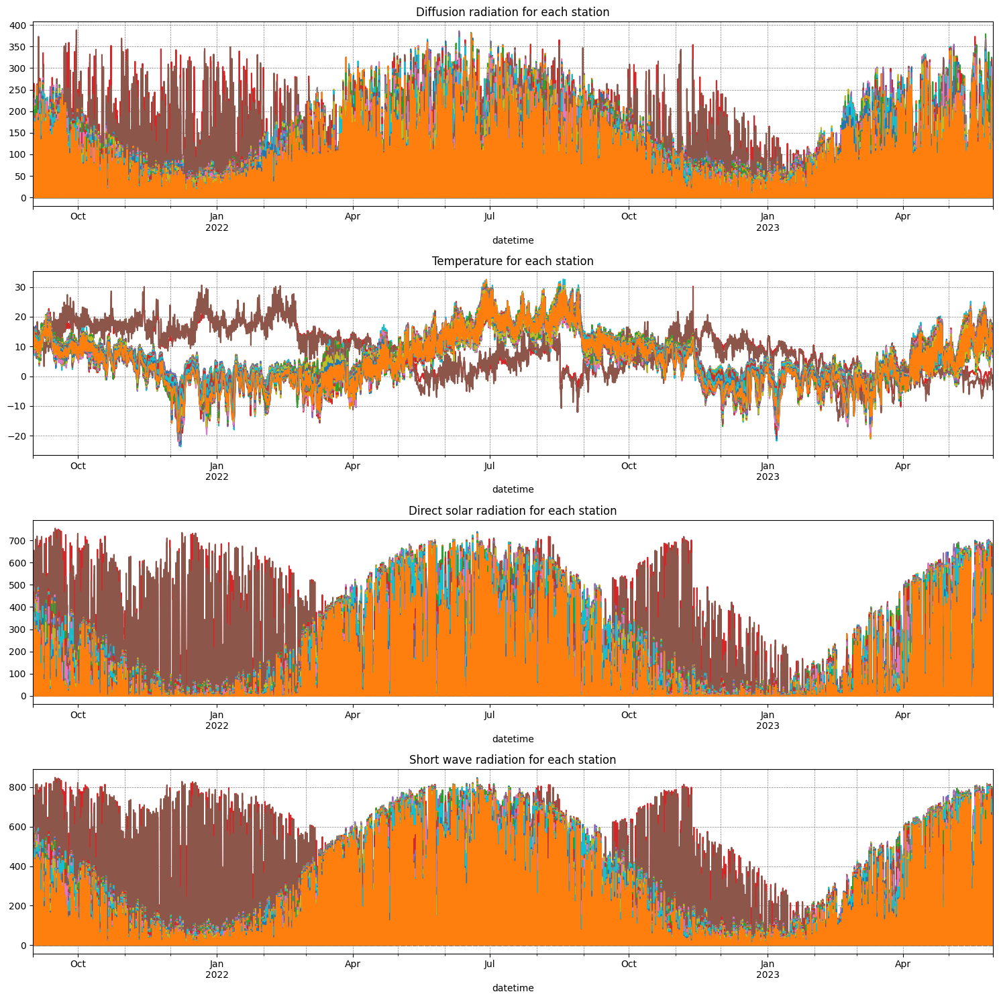

In [59]:
fig, (ax1,ax2,ax3,ax4) = plt.subplots(4,1,figsize=(15,15))

weather_hist3_pivot['diffuse_radiation'].plot(ax=ax1)
weather_hist3_pivot['temperature'].plot(ax=ax2)
weather_hist3_pivot['direct_solar_radiation'].plot(ax=ax3)
weather_hist3_pivot['shortwave_radiation'].plot(ax=ax4)

ax1.set_title('Diffusion radiation for each station')

ax2.set_title('Temperature for each station')

ax3.set_title('Direct solar radiation for each station')

ax4.set_title('Short wave radiation for each station')

ax1.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax4.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax4.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')

ax1.legend().set_visible(False)
ax2.legend().set_visible(False)
ax3.legend().set_visible(False)
ax4.legend().set_visible(False)

plt.tight_layout()
plt.legend().set_visible(False)
plt.show()

### 5.3.1 Distinguish between station clusters

In [66]:
# Distinguish the two stations that seem to have data significantly different from the other stations

weather_hist3_minority = weather_hist3[(weather_hist3['city'] == 3) | (weather_hist3['city'] == 5)]
weather_hist3_majority = weather_hist3[(weather_hist3['city'] != 3) & (weather_hist3['city'] != 5)]

In [70]:
weather_hist3_minority_avg = weather_hist3_minority.groupby(by='datetime').mean()
weather_hist3_majority_avg = weather_hist3_majority.groupby(by='datetime').mean()

In [74]:
weather_hist3_majority_avg['type'] = 'Majority stations'
weather_hist3_minority_avg['type'] = 'Minority stations'

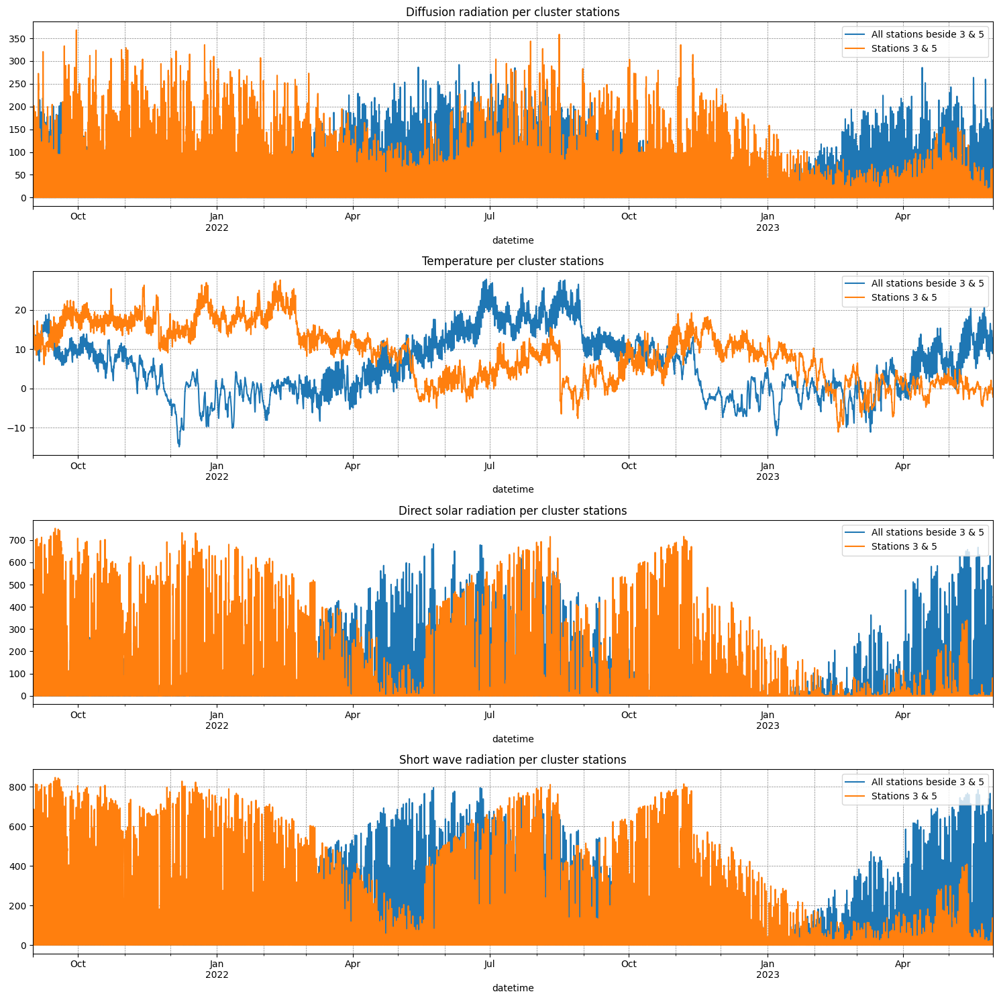

In [86]:
fig, (ax1,ax2,ax3,ax4) = plt.subplots(4,1,figsize=(15,15))

weather_hist3_majority_avg['diffuse_radiation'].plot(ax=ax1, label='All stations beside 3 & 5')
weather_hist3_majority_avg['temperature'].plot(ax=ax2, label='All stations beside 3 & 5')
weather_hist3_majority_avg['direct_solar_radiation'].plot(ax=ax3, label='All stations beside 3 & 5')
weather_hist3_majority_avg['shortwave_radiation'].plot(ax=ax4, label='All stations beside 3 & 5')

weather_hist3_minority_avg['diffuse_radiation'].plot(ax=ax1, label='Stations 3 & 5')
weather_hist3_minority_avg['temperature'].plot(ax=ax2, label='Stations 3 & 5')
weather_hist3_minority_avg['direct_solar_radiation'].plot(ax=ax3, label='Stations 3 & 5')
weather_hist3_minority_avg['shortwave_radiation'].plot(ax=ax4, label='Stations 3 & 5')

ax1.set_title('Diffusion radiation per cluster stations')
ax2.set_title('Temperature per cluster stations')
ax3.set_title('Direct solar radiation per cluster stations')
ax4.set_title('Short wave radiation per cluster stations')

ax1.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax3.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax4.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')

ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()

plt.tight_layout()
plt.show()

### 5.3.3 Solar weather evolution per week

In [125]:
weather_hist3_minority_weekly = weather_hist3_minority_avg.resample('W').mean()
weather_hist3_majority_weekly = weather_hist3_majority_avg.resample('W').mean()

In [135]:
weather_hist3_majority_weekly['year'] = weather_hist3_majority_weekly.index.year
weather_hist3_minority_weekly['year'] = weather_hist3_minority_weekly.index.year

weather_hist3_majority_weekly['week'] = weather_hist3_majority_weekly.index.week
weather_hist3_minority_weekly['week'] = weather_hist3_minority_weekly.index.week

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_18116/3252527856.py:4: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  weather_hist3_majority_weekly['week'] = weather_hist3_majority_weekly.index.week
/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_18116/3252527856.py:5: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  weather_hist3_minority_weekly['week'] = weather_hist3_minority_weekly.index.week


In [136]:
weather_hist3_majority_weekly2021 = weather_hist3_majority_weekly[weather_hist3_majority_weekly['year']==2021]
weather_hist3_majority_weekly2022 = weather_hist3_majority_weekly[weather_hist3_majority_weekly['year']==2022]
weather_hist3_majority_weekly2023 = weather_hist3_majority_weekly[weather_hist3_majority_weekly['year']==2023]

In [137]:
weather_hist3_minority_weekly2021 = weather_hist3_minority_weekly[weather_hist3_minority_weekly['year']==2021]
weather_hist3_minority_weekly2022 = weather_hist3_minority_weekly[weather_hist3_minority_weekly['year']==2022]
weather_hist3_minority_weekly2023 = weather_hist3_minority_weekly[weather_hist3_minority_weekly['year']==2023]

In [143]:
weather_hist3_minority_weekly2023.index.sort_values
weather_hist3_minority_weekly2023['week'] = weather_hist3_minority_weekly2023['week'] + 1
weather_hist3_minority_weekly2023.loc['2023-01-01','week'] = 1

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_18116/1078639015.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weather_hist3_minority_weekly2023['week'] = weather_hist3_minority_weekly2023['week'] + 1


In [147]:
weather_hist3_minority_weekly2022.index.sort_values
weather_hist3_minority_weekly2022['week'] = weather_hist3_minority_weekly2022['week'] + 1
weather_hist3_minority_weekly2022.loc['2022-01-02','week'] = 1

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_18116/2920347820.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weather_hist3_minority_weekly2022['week'] = weather_hist3_minority_weekly2022['week'] + 1


In [150]:
weather_hist3_majority_weekly2023.index.sort_values
weather_hist3_majority_weekly2023['week'] = weather_hist3_majority_weekly2023['week'] + 1
weather_hist3_majority_weekly2023.loc['2023-01-01','week'] = 1

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_18116/1788630769.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weather_hist3_majority_weekly2023['week'] = weather_hist3_majority_weekly2023['week'] + 1


In [152]:
weather_hist3_majority_weekly2022.index.sort_values
weather_hist3_majority_weekly2022['week'] = weather_hist3_majority_weekly2022['week'] + 1
weather_hist3_majority_weekly2022.loc['2022-01-02','week'] = 1

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_18116/407980888.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weather_hist3_majority_weekly2022['week'] = weather_hist3_majority_weekly2022['week'] + 1


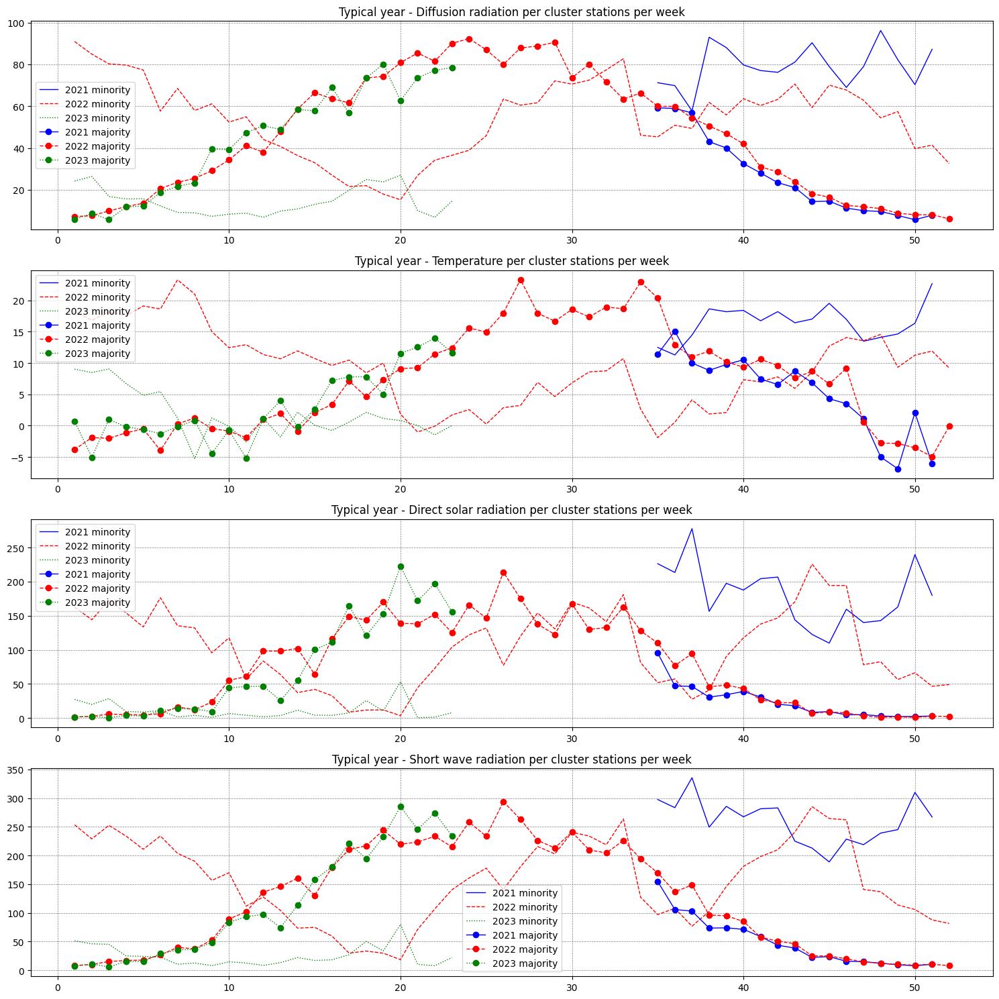

In [160]:
fig, (ax1,ax2,ax3,ax4) = plt.subplots(4,1,figsize=(15,15))

# Diffusion radiation graph
ax1.plot(weather_hist3_minority_weekly2021['week'], weather_hist3_minority_weekly2021['diffuse_radiation'], label='2021 minority', color='b', linestyle='-', linewidth=1)
ax1.plot(weather_hist3_minority_weekly2022['week'], weather_hist3_minority_weekly2022['diffuse_radiation'], label='2022 minority', color='r', linestyle='--', linewidth=1)
ax1.plot(weather_hist3_minority_weekly2023['week'], weather_hist3_minority_weekly2023['diffuse_radiation'], label='2023 minority', color='g', linestyle=':', linewidth=1)

ax1.plot(weather_hist3_majority_weekly2021['week'], weather_hist3_majority_weekly2021['diffuse_radiation'], label='2021 majority', color='b', marker='o', linestyle='-', linewidth=1)
ax1.plot(weather_hist3_majority_weekly2022['week'], weather_hist3_majority_weekly2022['diffuse_radiation'], label='2022 majority', color='r', marker='o', linestyle='--', linewidth=1)
ax1.plot(weather_hist3_majority_weekly2023['week'], weather_hist3_majority_weekly2023['diffuse_radiation'], label='2023 majority', color='g', marker='o',linestyle=':', linewidth=1)

# Temperature graph
ax2.plot(weather_hist3_minority_weekly2021['week'], weather_hist3_minority_weekly2021['temperature'], label='2021 minority', color='b', linestyle='-', linewidth=1)
ax2.plot(weather_hist3_minority_weekly2022['week'], weather_hist3_minority_weekly2022['temperature'], label='2022 minority', color='r', linestyle='--', linewidth=1)
ax2.plot(weather_hist3_minority_weekly2023['week'], weather_hist3_minority_weekly2023['temperature'], label='2023 minority', color='g', linestyle=':', linewidth=1)

ax2.plot(weather_hist3_majority_weekly2021['week'], weather_hist3_majority_weekly2021['temperature'], label='2021 majority', color='b', marker='o', linestyle='-', linewidth=1)
ax2.plot(weather_hist3_majority_weekly2022['week'], weather_hist3_majority_weekly2022['temperature'], label='2022 majority', color='r', marker='o', linestyle='--', linewidth=1)
ax2.plot(weather_hist3_majority_weekly2023['week'], weather_hist3_majority_weekly2023['temperature'], label='2023 majority', color='g', marker='o',linestyle=':', linewidth=1)

## Direct solar radiation
ax3.plot(weather_hist3_minority_weekly2021['week'], weather_hist3_minority_weekly2021['direct_solar_radiation'], label='2021 minority', color='b', linestyle='-', linewidth=1)
ax3.plot(weather_hist3_minority_weekly2022['week'], weather_hist3_minority_weekly2022['direct_solar_radiation'], label='2022 minority', color='r', linestyle='--', linewidth=1)
ax3.plot(weather_hist3_minority_weekly2023['week'], weather_hist3_minority_weekly2023['direct_solar_radiation'], label='2023 minority', color='g', linestyle=':', linewidth=1)

ax3.plot(weather_hist3_majority_weekly2021['week'], weather_hist3_majority_weekly2021['direct_solar_radiation'], label='2021 majority', color='b', marker='o', linestyle='-', linewidth=1)
ax3.plot(weather_hist3_majority_weekly2022['week'], weather_hist3_majority_weekly2022['direct_solar_radiation'], label='2022 majority', color='r', marker='o', linestyle='--', linewidth=1)
ax3.plot(weather_hist3_majority_weekly2023['week'], weather_hist3_majority_weekly2023['direct_solar_radiation'], label='2023 majority', color='g', marker='o',linestyle=':', linewidth=1)

## Short wave radiation
ax4.plot(weather_hist3_minority_weekly2021['week'], weather_hist3_minority_weekly2021['shortwave_radiation'], label='2021 minority', color='b', linestyle='-', linewidth=1)
ax4.plot(weather_hist3_minority_weekly2022['week'], weather_hist3_minority_weekly2022['shortwave_radiation'], label='2022 minority', color='r', linestyle='--', linewidth=1)
ax4.plot(weather_hist3_minority_weekly2023['week'], weather_hist3_minority_weekly2023['shortwave_radiation'], label='2023 minority', color='g', linestyle=':', linewidth=1)

ax4.plot(weather_hist3_majority_weekly2021['week'], weather_hist3_majority_weekly2021['shortwave_radiation'], label='2021 majority', color='b', marker='o', linestyle='-', linewidth=1)
ax4.plot(weather_hist3_majority_weekly2022['week'], weather_hist3_majority_weekly2022['shortwave_radiation'], label='2022 majority', color='r', marker='o', linestyle='--', linewidth=1)
ax4.plot(weather_hist3_majority_weekly2023['week'], weather_hist3_majority_weekly2023['shortwave_radiation'], label='2023 majority', color='g', marker='o',linestyle=':', linewidth=1)


ax1.set_title('Typical year - Diffusion radiation per cluster stations per week')
ax2.set_title('Typical year - Temperature per cluster stations per week')
ax3.set_title('Typical year - Direct solar radiation per cluster stations per week')
ax4.set_title('Typical year - Short wave radiation per cluster stations per week')

ax1.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax3.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')
ax4.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey')

ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()

plt.tight_layout()
plt.show()

## 5.4 - Correlation between features

In [172]:
weather_hist2.head(2)

,datetime,temperature,dewpoint,rain,snowfall,surface_pressure,cloudcover_total,cloudcover_low,cloudcover_mid,cloudcover_high,windspeed_10m,winddirection_10m,shortwave_radiation,direct_solar_radiation,diffuse_radiation,latitude,longitude,data_block_id,city
0,2021-09-01,14.2,11.6,0.0,0.0,1015.9,31,31,0,11,7.083333,8,0.0,0.0,0.0,57.6,21.7,1.0,0
1,2021-09-01,13.9,11.5,0.0,0.0,1010.7,33,37,0,0,5.111111,359,0.0,0.0,0.0,57.6,22.2,1.0,1


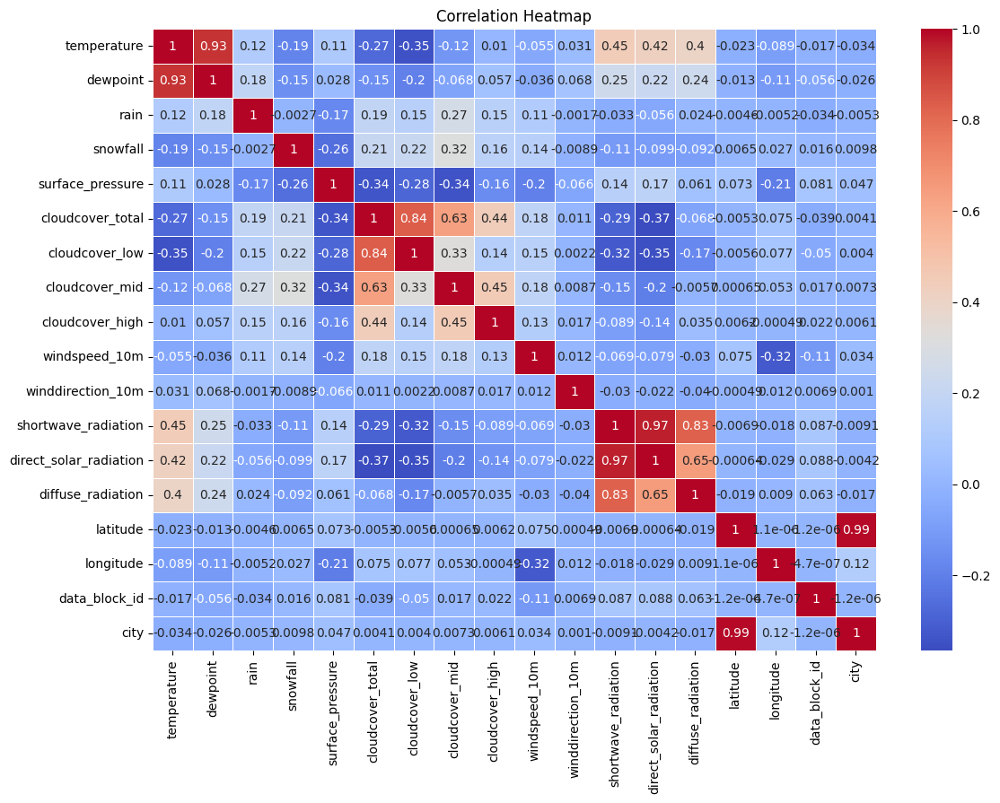

In [171]:
correlation_matrix = weather_hist2.corr()

plt.figure(figsize=(13, 9))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [178]:
correlation_matrix = weather_hist2.corr().abs()

high_corr_var = np.where(correlation_matrix > 0.9)
high_corr_var = [(correlation_matrix.index[x], correlation_matrix.columns[y]) for x, y in zip(*high_corr_var) if x != y and x < y]

# Display highly correlated pairs of features
print("Paires de features fortement corrélées (corrélation > 0.9) :")
for pair in high_corr_var:
    print(pair)

Paires de features fortement corrélées (corrélation > 0.9) :
('temperature', 'dewpoint')
('shortwave_radiation', 'direct_solar_radiation')
('latitude', 'city')


## 5.5 - Electricity and gas price with temperature

### 5.5.1 Setup

In [503]:
weather_hist_to_compare = weather_hist2.copy()
weather_hist_to_compare['datetime'] = pd.to_datetime(weather_hist_to_compare['datetime'], format='%Y-%m-%d %H:%M:%S')
weather_hist_to_compare['date'] = weather_hist_to_compare['datetime'].dt.date
weather_hist_to_compare['date'] = pd.to_datetime(weather_hist_to_compare['date'], format='%Y-%m-%d')
weather_hist_to_compare = weather_hist_to_compare.groupby('date').mean()
weather_hist_to_compare = weather_hist_to_compare[['temperature']]

In [504]:
elec_price_to_compare = elec_price2.copy()
elec_price_to_compare['forecast_date'] = pd.to_datetime(elec_price_to_compare['forecast_date'], format='%Y-%m-%d %H:%M:%S')
elec_price_to_compare['date'] = elec_price_to_compare['forecast_date'].dt.date
elec_price_to_compare['date'] = pd.to_datetime(elec_price_to_compare['date'], format='%Y-%m-%d')
elec_price_to_compare = elec_price_to_compare.groupby('date').mean()

In [521]:
gas_price_to_compare = gas_price.copy()
#gas_price_to_compare.set_index('forecast_date', inplace=True)
gas_price_to_compare['forecast_date'] = pd.to_datetime(gas_price_to_compare['forecast_date'], format='%Y-%m-%d')
gas_price_to_compare['mean_price'] = gas_price_to_compare[['lowest_price_per_mwh','highest_price_per_mwh']].mean(axis=1)
gas_price_to_compare.set_index('forecast_date', inplace=True)
gas_price_to_compare = gas_price_to_compare[['mean_price']]

In [523]:
elec_price_to_compare

,euros_per_mwh
date,
2021-09-01,110.467083
2021-09-02,112.631250
2021-09-03,107.429583
2021-09-04,106.112917
2021-09-05,99.045417
...,...
2023-05-26,54.062083
2023-05-27,62.561667
2023-05-28,44.451250


### 5.5.2 Show Electricity price, gas price and temperature in a same graph

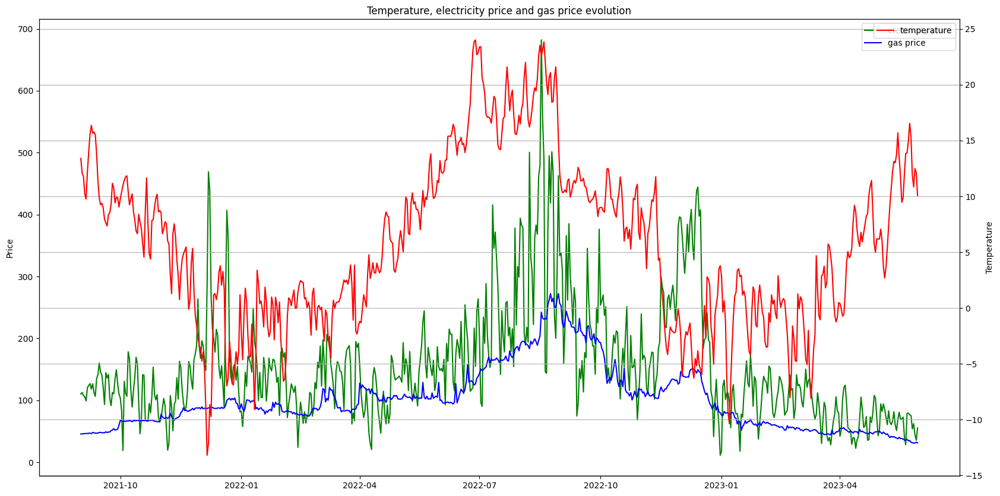

In [520]:
fig , ax1 = plt.subplots(figsize=(20,10))


ax1.plot(elec_price_to_compare, label='electricity price', color='green')
ax1.plot(gas_price_to_compare, label='gas price', color='blue')
ax1.set_ylabel('Price')

ax2 = ax1.twinx()
ax2.plot(weather_hist_to_compare, label='temperature', color='red')
ax2.set_ylabel('Temperature')

plt.title('Temperature, electricity price and gas price evolution')

ax2.legend()
ax1.legend()

plt.grid()
plt.legend()
plt.show()

### 5.5.3 Show trend for Electricity price, gas price and temperature in a same graph

In [535]:
moving_average_temperature = weather_hist_to_compare['temperature'].rolling(
    window=15,
    center=True,
    min_periods=7,
).mean()

In [536]:
moving_average_elec = elec_price_to_compare['euros_per_mwh'].rolling(
    window=15,
    center=True,
    min_periods=7,
).mean()

In [537]:
moving_average_gas = gas_price_to_compare['mean_price'].rolling(
    window=15,
    center=True,
    min_periods=7,
).mean()

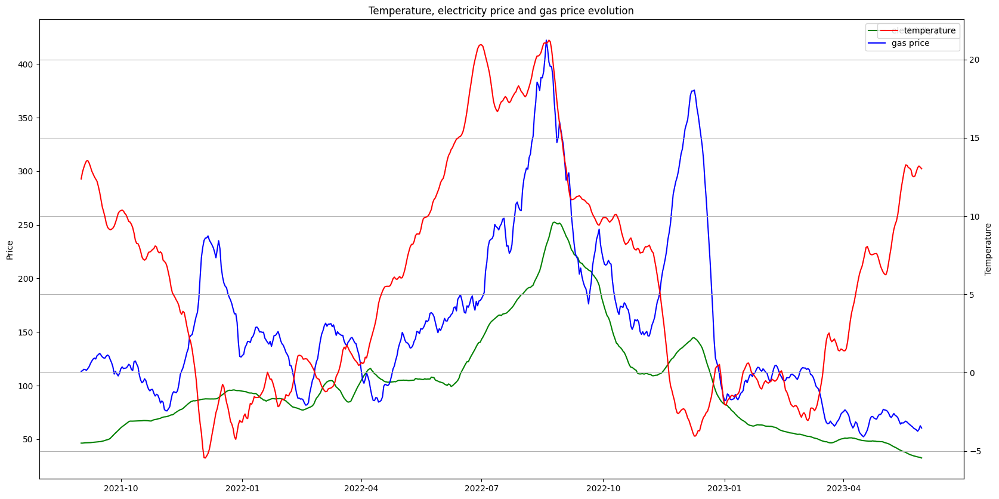

In [539]:
fig , ax1 = plt.subplots(figsize=(20,10))


ax1.plot(moving_average_gas, label='electricity price', color='green')
ax1.plot(moving_average_elec, label='gas price', color='blue')
ax1.set_ylabel('Price')

ax2 = ax1.twinx()
ax2.plot(moving_average_temperature, label='temperature', color='red')
ax2.set_ylabel('Temperature')

plt.title('Temperature, electricity price and gas price evolution')

ax2.legend()
ax1.legend()

plt.grid()
plt.legend()
plt.show()

## 5.6 - Conclusion

Based on the analyses conducted above, several conclusions can be drawn:

1. Stations appear to be evenly distributed across the territory of Estonia.

2. Two stations, 3 and 5, appear to be very different in terms of meteorological readings. For example, in January, these two stations have high solar radiation values compared to other stations. However, on the map, these two stations do not appear to be located in areas more conducive to receiving sunlight.

3. The variations in solar characteristics seem to follow expected patterns: higher values during summer and lower values towards winter.

4. Correlations appear to be present, notably and logically among features related to sunlight. Some correlations are very strong (>0.9), which could provide little relevant information for our models.

5. Temperatures and gas and electricity prices seem to have similar trends. Indeed, by the end of 2021, we can see that temperatures are dropping, and so mechanically, due to the increase in demand, prices are rising. The same phenomenon can be seen at the end of 2022.

# 6 - Weather forecast EDA

## 6.0 - Questions

I am going to study in detail in this section the dataset related to forecast weather. In particular, i'll try to answer the following questions:

1. Are the weather forecasts accurate compared to the actual values?
2. Are short-term forecasts of better quality than long-term forecasts?
3. What should be done with this dataset going forward?

## 6.1 - Setup

In [193]:
weather_forecast2 = weather_forecast.copy()

In [226]:
weather_forecast2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3424512 entries, 0 to 3424511
Data columns (total 19 columns):
 #   Column                             Dtype  
---  ------                             -----  
 0   latitude                           float64
 1   longitude                          float64
 2   origin_datetime                    object 
 3   hours_ahead                        int64  
 4   temperature                        float64
 5   dewpoint                           float64
 6   cloudcover_high                    float64
 7   cloudcover_low                     float64
 8   cloudcover_mid                     float64
 9   cloudcover_total                   float64
 10  10_metre_u_wind_component          float64
 11  10_metre_v_wind_component          float64
 12  data_block_id                      int64  
 13  forecast_datetime                  object 
 14  direct_solar_radiation             float64
 15  surface_solar_radiation_downwards  float64
 16  snowfall          

In [230]:
weather_forecast2['forecast_datetime'] = pd.to_datetime(weather_forecast2['forecast_datetime'], format='%Y-%m-%d %H:%M:%S')
weather_forecast2['origin_datetime'] = pd.to_datetime(weather_forecast2['origin_datetime'], format='%Y-%m-%d %H:%M:%S')

In [165]:
weather_hist['datetime'].min(), weather_hist['datetime'].max()

('2021-09-01 00:00:00', '2023-05-30 10:00:00')

In [179]:
weather_forecast2['origin_datetime'].min() , weather_forecast2['origin_datetime'].max()

('2021-09-01 02:00:00', '2023-05-30 02:00:00')

In [180]:
weather_forecast2.tail()

,latitude,longitude,origin_datetime,hours_ahead,temperature,dewpoint,cloudcover_high,cloudcover_low,cloudcover_mid,cloudcover_total,10_metre_u_wind_component,10_metre_v_wind_component,data_block_id,forecast_datetime,direct_solar_radiation,surface_solar_radiation_downwards,snowfall,total_precipitation
3424507,59.7,26.2,2023-05-30 02:00:00,48,10.150049,5.662744,0.061066,0.257339,0.004059,0.308594,6.890626,-3.258144,637,2023-06-01 02:00:00,0.0,0.0,0.0,0.0
3424508,59.7,26.7,2023-05-30 02:00:00,48,10.259790,5.922754,0.107880,0.895203,0.198700,0.906036,6.890626,-3.768032,637,2023-06-01 02:00:00,0.0,0.0,0.0,0.0
3424509,59.7,27.2,2023-05-30 02:00:00,48,10.467798,6.072534,0.000000,0.387466,0.448853,0.530518,6.214112,-4.700405,637,2023-06-01 02:00:00,0.0,0.0,0.0,0.0
3424510,59.7,27.7,2023-05-30 02:00:00,48,10.694116,7.009058,0.000000,0.505936,0.997314,0.997498,5.810060,-4.338345,637,2023-06-01 02:00:00,0.0,0.0,0.0,0.0
3424511,59.7,28.2,2023-05-30 02:00:00,48,11.233179,7.069238,0.703461,0.292313,0.934021,0.989716,2.719728,-0.922939,637,2023-06-01 02:00:00,0.0,0.0,0.0,0.0


## 6.2 - Compare the overall quality of the forecast (no distinction by city)

### 6.2.1 - Setup

In [292]:
## Identitify the matching columns between historical and forecast dataset

weather_forecast_list = weather_forecast2.columns.tolist()
weather_hist_list = weather_hist.columns.to_list()
matching_columns = []

for i in weather_forecast_list :
    if i in weather_hist_list :
        matching_columns.append(i)

print("Below are the matching colums between the 2 datasets")
print(matching_columns)

Below are the matching colums between the 2 datasets
['latitude', 'longitude', 'temperature', 'dewpoint', 'cloudcover_high', 'cloudcover_low', 'cloudcover_mid', 'cloudcover_total', 'data_block_id', 'direct_solar_radiation', 'snowfall']


In [194]:
# Create a unique column for each coordinate pair
weather_forecast2['city'] = pd.factorize(weather_forecast2[['latitude','longitude']].apply(tuple,axis=1))[0]

In [253]:
## Create 48 datasets, one for each hours ahead forecast and store them in a dictionnary

max_hour_forecast = weather_forecast2.hours_ahead.value_counts().index.max()
weather_forecast_ahead_dict = {}

for i in range(1,max_hour_forecast+1) :
    dataset_name = f'weather_forecast_ahead{i}'
    dataset_name = weather_forecast2[weather_forecast2['hours_ahead']== i]
    weather_forecast_ahead_dict[i] = dataset_name

In [293]:
## For each of the 48 datasets created, group data per day, no matter the city

weather_forecast_ahead_dict_grouped = {}
counter = 1

for key in weather_forecast_ahead_dict.keys():
    dataset_name_grouped = weather_forecast_ahead_dict[key].groupby(('forecast_datetime')).mean()
    dataset_name_grouped.index=dataset_name_grouped.index.date
    dataset_name_grouped = dataset_name_grouped[matching_columns]
    weather_forecast_ahead_dict_grouped[counter] = dataset_name_grouped
    counter+=1

In [358]:
## Group the historical weather dataset by date so that we can compare the forecast with the historical data

weather_hist2_grouped_date = weather_hist2.groupby(pd.Grouper(key='datetime',freq='D')).mean()

## Keep only the matching colums

weather_hist2_grouped_date = weather_hist2_grouped_date[matching_columns]

##drop latitude and longitude features

weather_hist2_grouped_date.drop(columns=['latitude','longitude'],inplace=True)


### 6.2.2 Visualize forecast perfomance compare to historical data

In [377]:
# Compare the historical (and true) data to the forecast and show the difference in % as performance of the forecast

weather_forecast_performance_dict = {}
counter = 1

for key in weather_forecast_ahead_dict_grouped.keys():
    dataset_performance = np.abs((weather_forecast_ahead_dict_grouped[key] - weather_hist2_grouped_date) / weather_hist2_grouped_date*100)
    dataset_performance.drop(columns=['latitude','longitude'],inplace=True)
    weather_forecast_performance_dict[key] = dataset_performance
    counter+=1

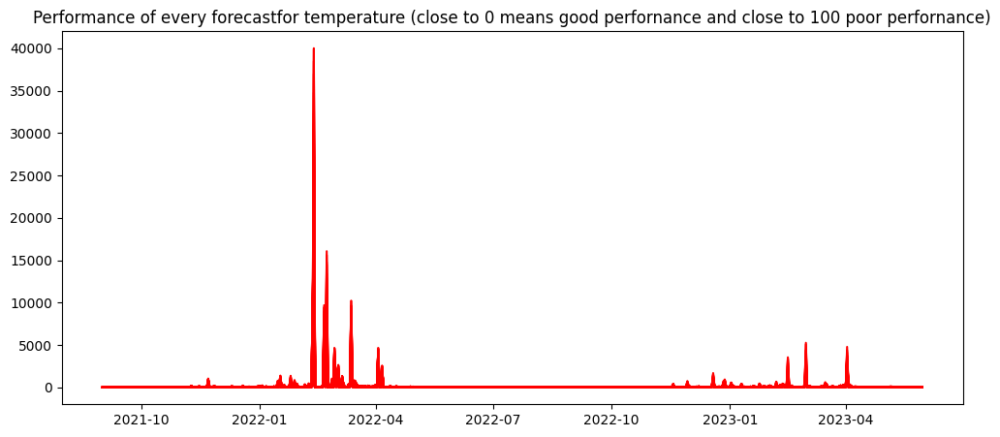

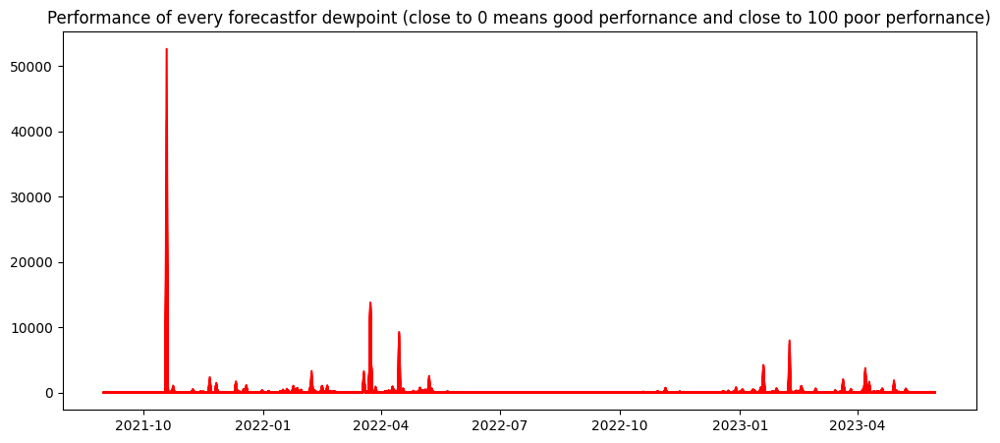

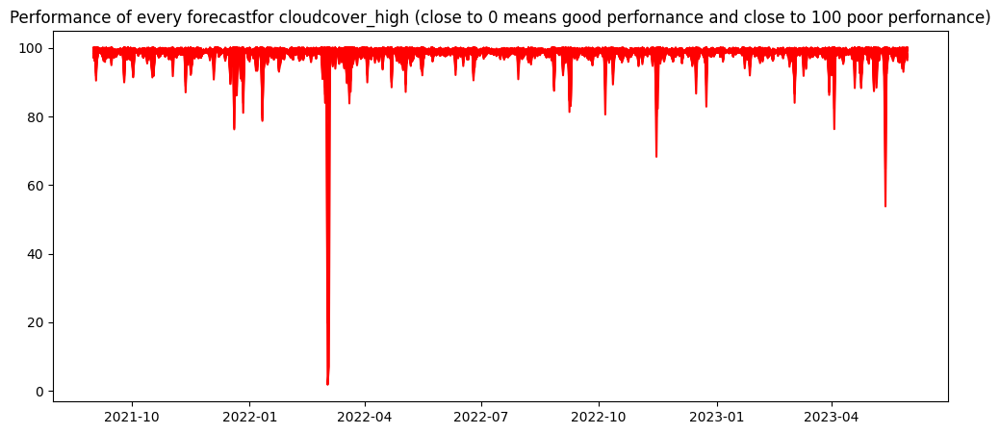

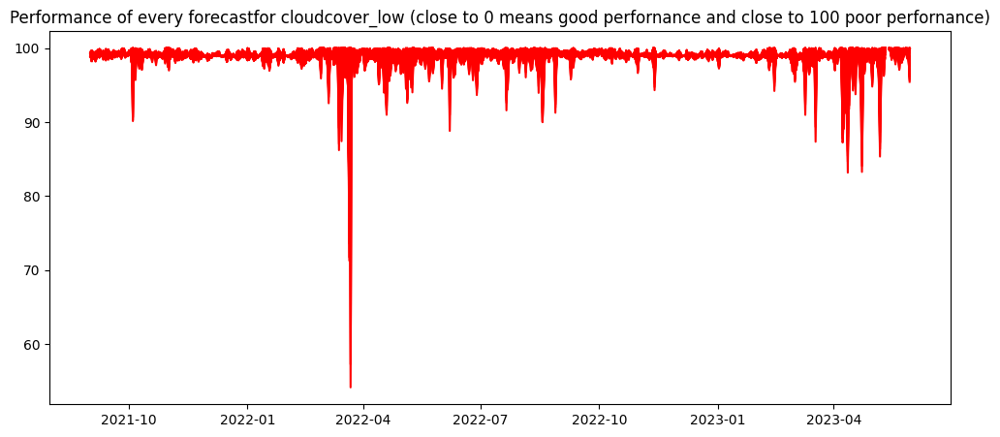

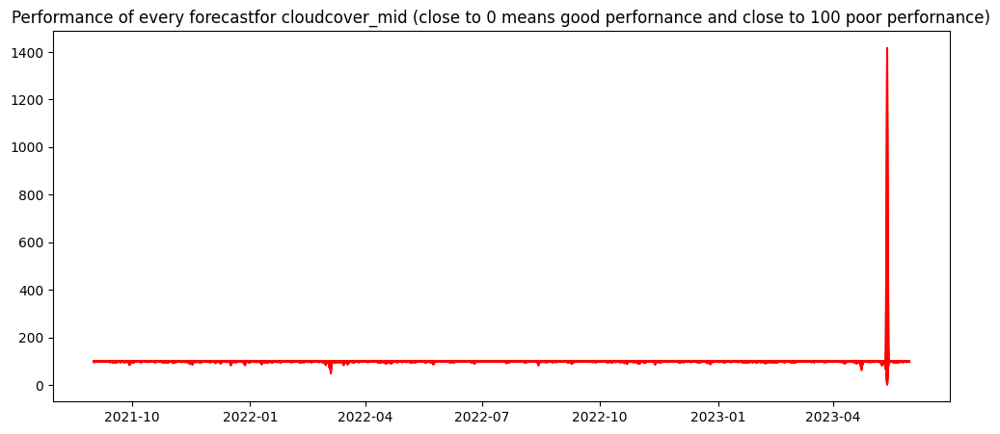

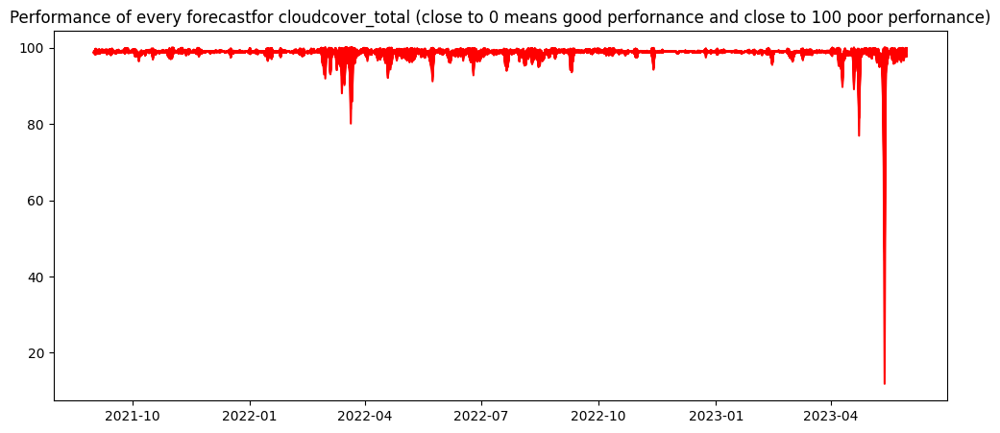

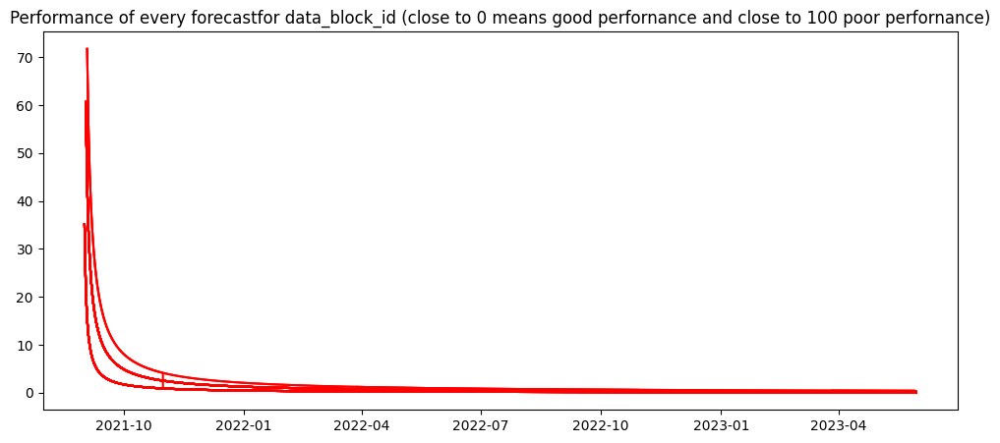

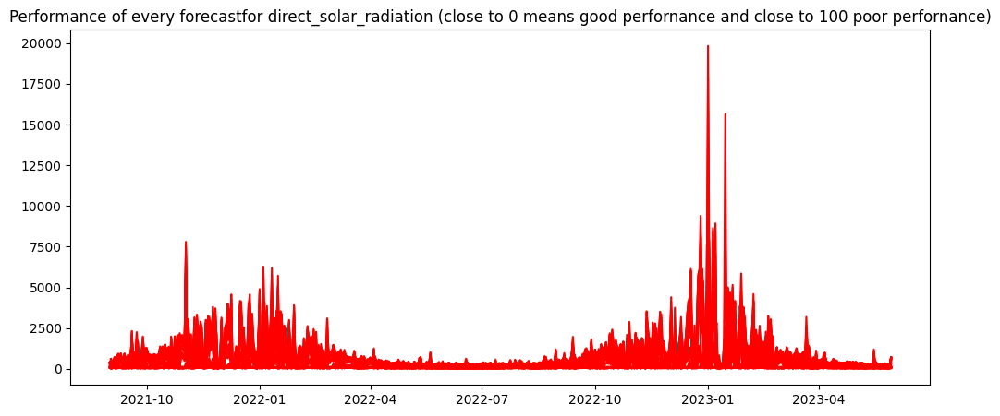

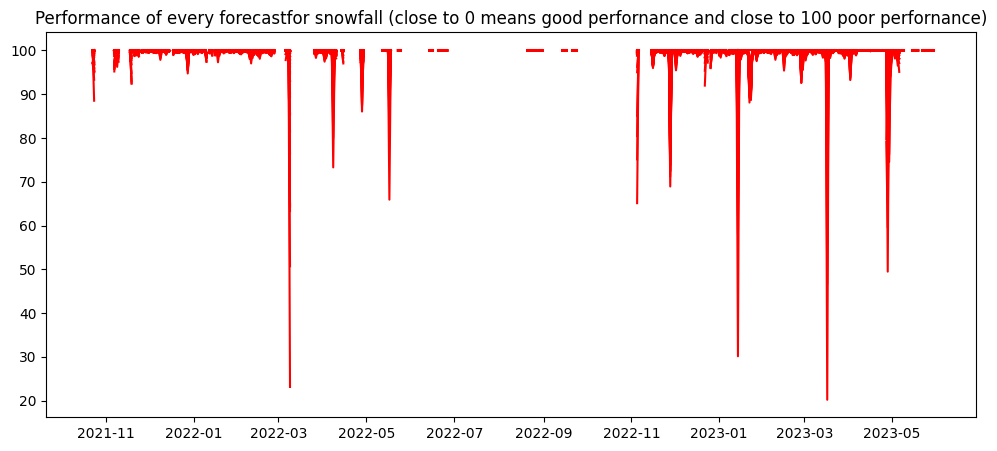

In [387]:
for feature in weather_hist2_grouped_date.columns:
    plt.figure(figsize=(12,5))
    for key, df in weather_forecast_performance_dict.items():
            plt.plot(df[feature], label='Precision', color='red')


    plt.title(f'Performance of every forecastfor {feature} (close to 0 means good perfornance and close to 100 poor perfornance)')
    plt.show()

### 6.2.3 Visualize forecast and historical data in graph

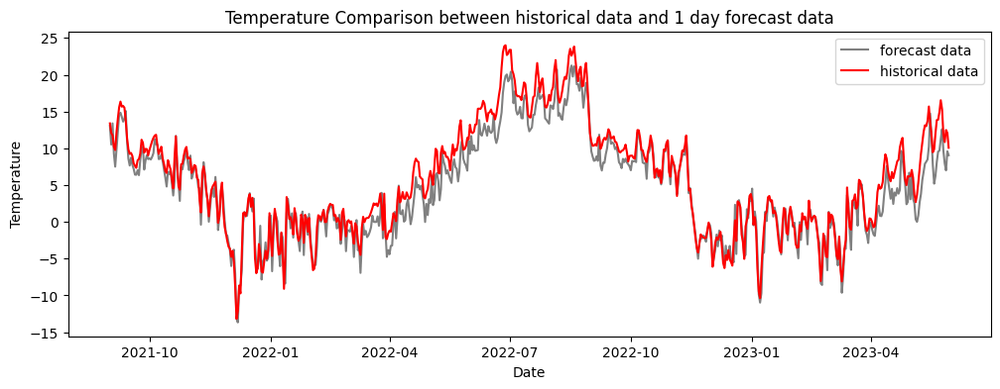

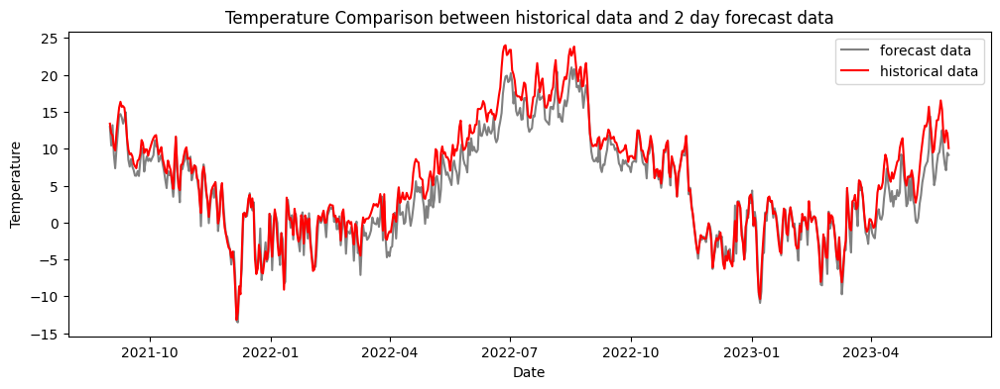

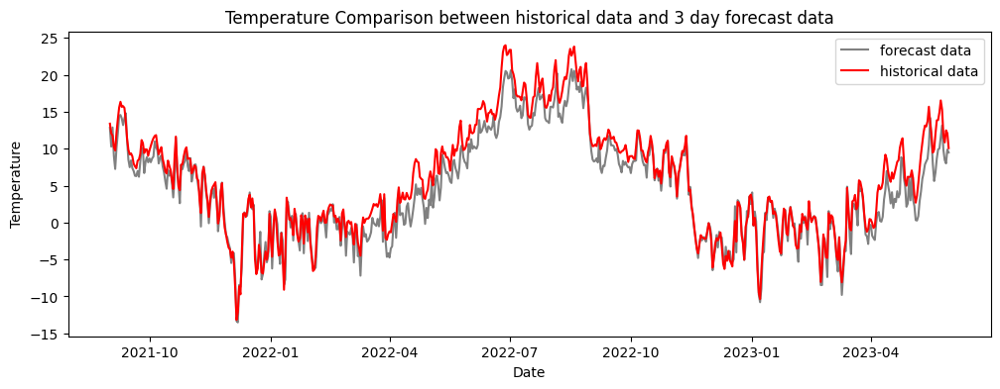

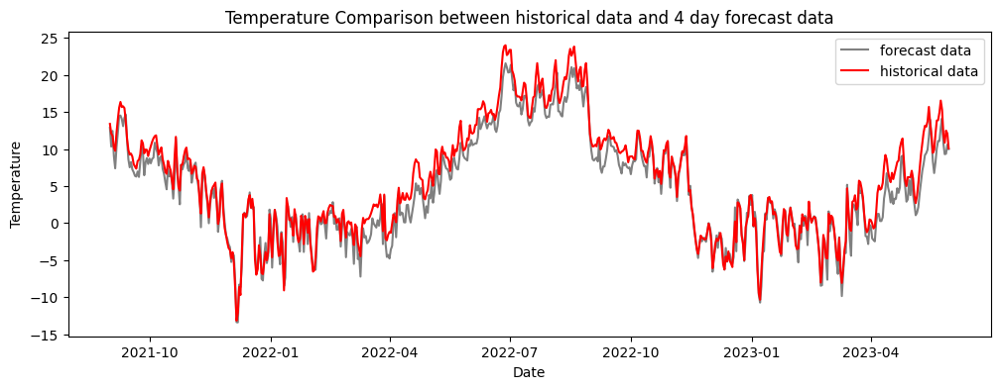

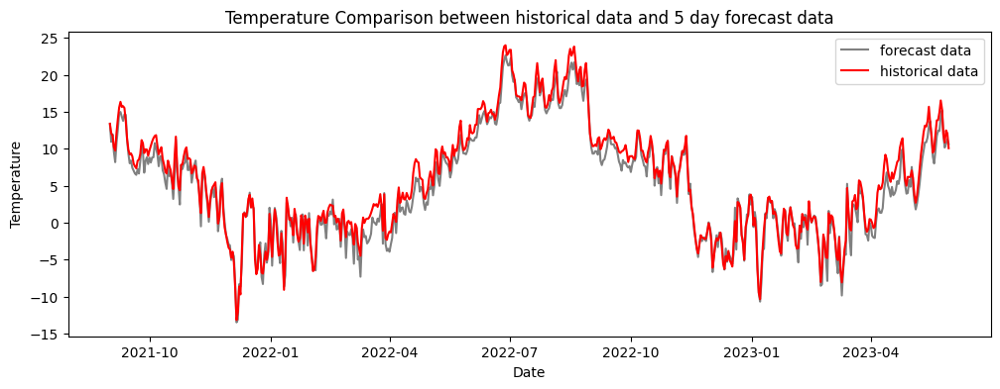

...

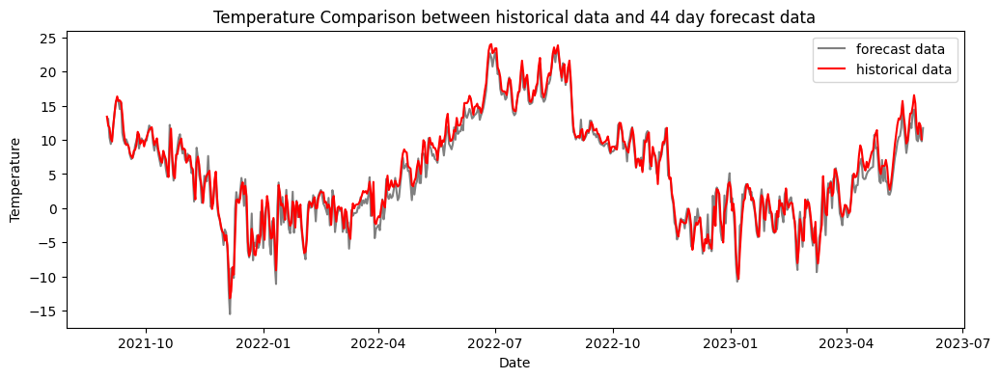

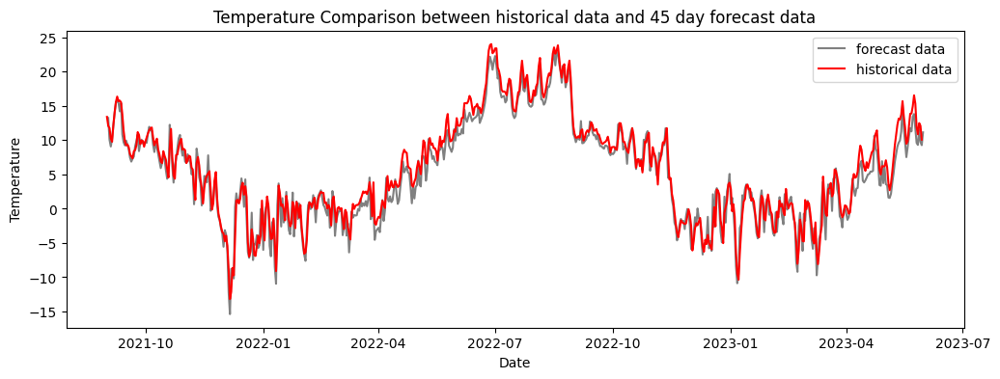

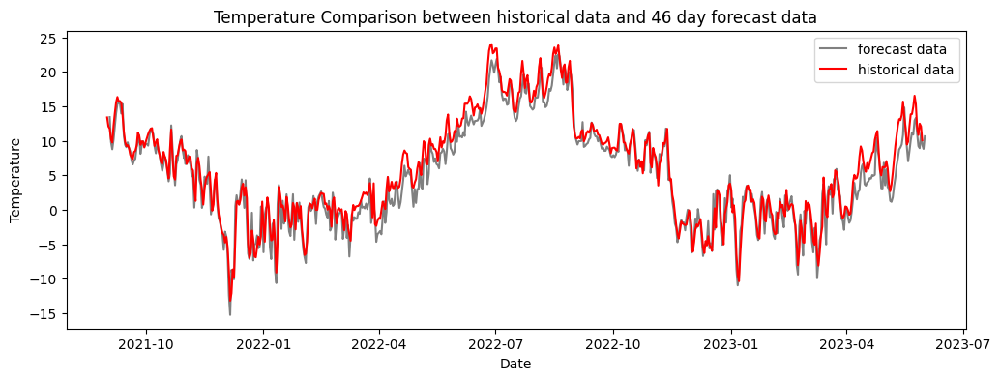

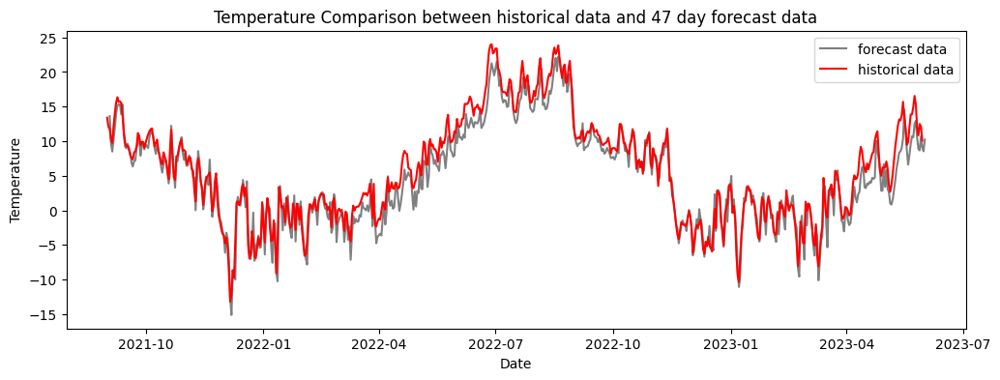

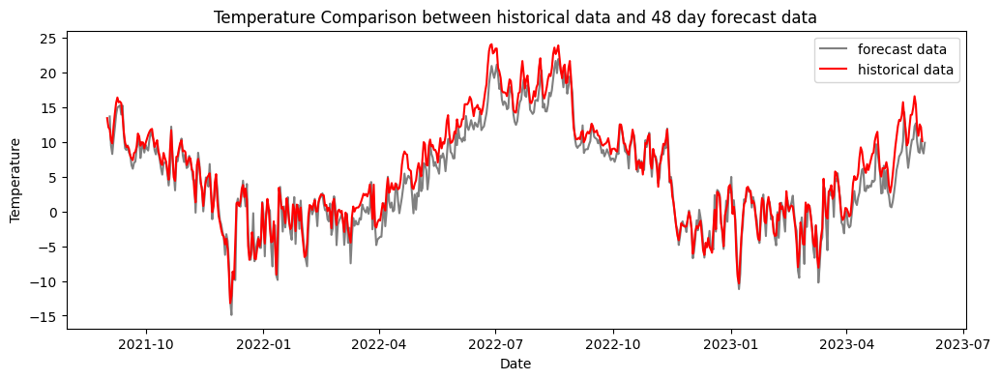

In [321]:
# Visualize the historical data with each forecast hour per hour (from 1 hour ahead to 48) to see how performant the forecast is

for key, df in weather_forecast_ahead_dict_grouped.items():
    plt.figure(figsize=(12,4))
    plt.plot(df['temperature'], label='forecast data', color='grey')
    plt.plot(weather_hist2_grouped_date['temperature'],label='historical data', color='red')
    plt.title(f'Temperature Comparison between historical data and {key} day forecast data')
    plt.xlabel('Date')
    plt.ylabel('Temperature')
    plt.legend()
    plt.show()

## 6.3 - Conclusion

Based on the analyses conducted above, several conclusions can be drawn:

1. The forecast data does not always appear to be accurate compared to actual events. Short-term forecasts do not necessarily show better performance or higher precision than long-term forecasts. In fact, some 30-day forecasts seem to be of better quality than short-term forecasts of 1 to 2 days.

2. Since this dataset aims to display forecasts but also includes historical and real-time data for the same periods, it does not seem relevant to continue using this dataset further. It was interesting for practicing coding skills, however.

# 7 - Train set EDA

## 7.0 - Questions

I am going to study in detail in this section the main train dataset. In particular, i'll try to answer the following questions:

1. What is the evolution of the target according to whether business or non-business and according to production or consumption?
2. What is the target distribution according to whether consumption or production is considered?

## 7.1 - Setup

In [11]:
train2 = train.copy()

In [575]:
dataset_presentation(train2)

                    
                    
General introduction
                    
Shape : (2018352, 9)
                    
--------------------
county is the following type : int64
county percentage missinge value : 0.0%
--------------------
--------------------
is_business is the following type : int64
is_business percentage missinge value : 0.0%
--------------------
--------------------
product_type is the following type : int64
product_type percentage missinge value : 0.0%
--------------------
--------------------
target is the following type : float64
target percentage missinge value : 0.00026159956241527744%
--------------------
--------------------
is_consumption is the following type : int64
is_consumption percentage missinge value : 0.0%
--------------------
--------------------
datetime is the following type : object
datetime percentage missinge value : 0.0%
--------------------
--------------------
data_block_id is the following type : int64
data_block_id percentage missin

In [576]:
train2.head()

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id
0,0,0,1,0.713,0,2021-09-01 00:00:00,0,0,0
1,0,0,1,96.590,1,2021-09-01 00:00:00,0,1,0
2,0,0,2,0.000,0,2021-09-01 00:00:00,0,2,1
3,0,0,2,17.314,1,2021-09-01 00:00:00,0,3,1
4,0,0,3,2.904,0,2021-09-01 00:00:00,0,4,2


In [22]:
# Keep only interesting columns and setup the date column

train2 = train2.drop(columns=['data_block_id','row_id','prediction_unit_id'])
train2['datetime']= pd.to_datetime(train2['datetime'], format='%Y-%m-%d %H:%M:%S')
train2 = train2.set_index('datetime');
train2.head()

,county,is_business,product_type,target,is_consumption
datetime,,,,,
2021-09-01,0,0,1,0.713,0
2021-09-01,0,0,1,96.590,1
2021-09-01,0,0,2,0.000,0
2021-09-01,0,0,2,17.314,1
2021-09-01,0,0,3,2.904,0


In [23]:
# Create 2 different datasets whether the line is producion or consumption

train_consumption = train2[train2['is_consumption']==1]
train_production = train2[train2['is_consumption']==0]

## 7.2 - Target evolution whether it's business or not

In [24]:
# Create 2 other datasets whether it's business or not

train_consumption_business = train_consumption[train_consumption['is_business']==1]
train_consumption_not_business = train_consumption[train_consumption['is_business']==0]

In [25]:
# Use groupby to regroup same date rows

train_consumption_business = train_consumption_business.reset_index()
train_consumption_business = train_consumption_business.groupby('datetime').sum()

train_consumption_not_business = train_consumption_not_business.reset_index()
train_consumption_not_business = train_consumption_not_business.groupby('datetime').sum()

In [26]:
# Use same process for production datasets

train_prod_business = train_production[train_production['is_business']==1]
train_prod_not_business = train_production[train_production['is_business']==0]

train_prod_business = train_prod_business.reset_index()
train_prod_business = train_prod_business.groupby('datetime').sum()

train_prod_not_business = train_prod_not_business.reset_index()
train_prod_not_business = train_prod_not_business.groupby('datetime').sum()

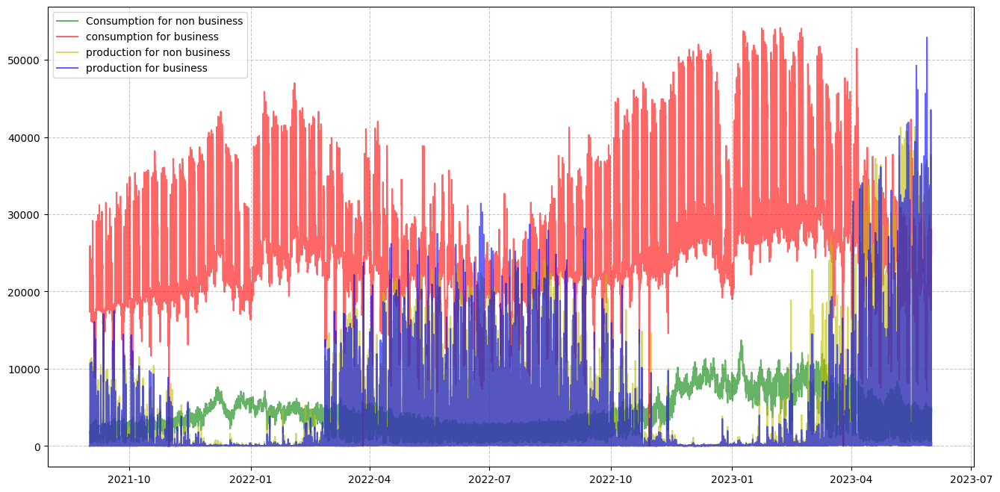

In [27]:
plt.figure(figsize=(16,8))

plt.plot(train_consumption_not_business.target, color= 'g', alpha=0.6, label='Consumption for non business')
plt.plot(train_consumption_business.target, color='r', alpha=0.6, label='consumption for business')

plt.plot(train_prod_not_business.target, color= 'y', alpha=0.6, label='production for non business')
plt.plot(train_prod_business.target, color='b', alpha=0.6, label='production for business')

plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

## 7.3 - Target distribution

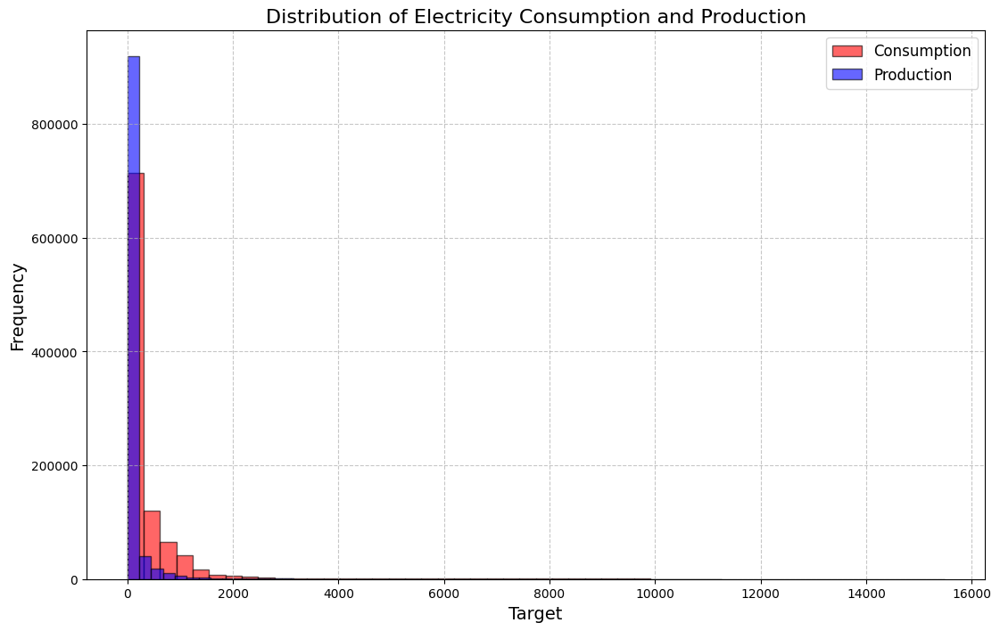

In [28]:
plt.figure(figsize=(13,8))
plt.hist(train_consumption['target'], bins=50, color='red', alpha=0.6, edgecolor='black', label='Consumption')
plt.hist(train_production['target'], bins=50, color='blue', alpha=0.6, edgecolor='black', label='Production')

plt.title('Distribution of Electricity Consumption and Production', fontsize=16)
plt.xlabel('Target', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.legend(loc='upper right', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

plt.show()

In [51]:
train_consumption['target_log']=np.log1p(train_consumption['target'])
train_production['target_log']=np.log1p(train_production['target'])

/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_37536/4108993952.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_consumption['target_log']=np.log1p(train_consumption['target'])
/var/folders/qx/vs5kgv557012y73k70gg87640000gn/T/ipykernel_37536/4108993952.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_production['target_log']=np.log1p(train_production['target'])


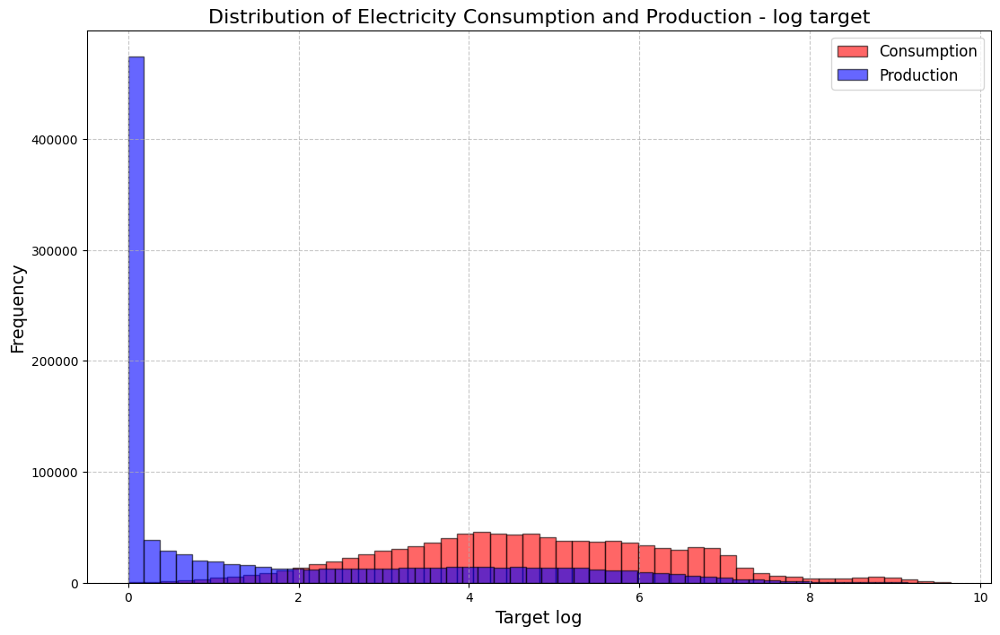

In [53]:
plt.figure(figsize=(13,8))
plt.hist(train_consumption['target_log'], bins=50, color='red', alpha=0.6, edgecolor='black', label='Consumption')
plt.hist(train_production['target_log'], bins=50, color='blue', alpha=0.6, edgecolor='black', label='Production')

plt.title('Distribution of Electricity Consumption and Production - log target', fontsize=16)
plt.xlabel('Target log', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.legend(loc='upper right', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

plt.show()

## 7.4 - Conclusion

Based on the analyses conducted above, several conclusions can be drawn:

1. Electricity production seems similar depending on whether the customer is a business or not. This seems surprising given that we saw in part 4. that business customers have a higher installed capacity. 

2. Conversely, there is a real difference between the consumption of business and non-business customers. In fact, we can imagine that business customers are perhaps industries or companies that are power-hungry. 

3. In terms of distribution, we see a skewed right distribution. We'll have to take this into account in the rest of our work. 